In [104]:
source("./piyush_enrichment_functions.R")

[1] "###################################"
[1] "Total inflam Signature: 10361"
[1] "inflam Signature Union: 4782"
[1] "inflam Signature Recurrent: 2120"
[1] "###################################"
[1] "Total Stress Signature: 11177"
[1] "Stress Signature Union: 5384"
[1] "Stress Signature Recurrent: 2036"
[1] "Stress Signature Unique: 115"
[1] "###################################"
[1] "Total Wound Signature: 2415"
[1] "Wound Signature Union: 1032"
[1] "Wound Signature Recurrent: 517"
[1] "Wound Healing Signature Unique: 30"
[1] "###################################"
[1] "Total Regen Signature: 665"
[1] "Regen Signature Union: 259"
[1] "Regen Signature Recurrent: 203"
[1] "Regeneration Signature Unique: 22"
[1] "Total H Gene Set Genes: 42516"
[1] "Total Available H Gene Set Genes: 40836"
[1] "aandersoni_regen upregulated"
[1] "aandersoni_regen total_datasets : 1"
[1] "################################################"
[1] "aandersoni_regen downregulated"
[1] "aandersoni_regen total_datasets 

Warning message in fread(current_file_path_down, header = FALSE):
“File '../data/geo_degs/xlaevis_wound_GSE116678_GSE116678_TRIM_60_TRIM_0_downregulated.txt' has size 0. Returning a NULL data.table.”
Warning message in fread(current_file_path_down, header = FALSE):
“File '../data/geo_degs/xlaevis_wound_GSE116678_GSE116678_TRIM_60_TRIM_30_downregulated.txt' has size 0. Returning a NULL data.table.”
Warning message in fread(current_file_path_up, header = FALSE):
“File '../data/geo_degs/xlaevis_wound_GSE116678_GSE116678_TRIM_90_TRIM_60_upregulated.txt' has size 0. Returning a NULL data.table.”


[1] "xlaevis_wound upregulated"
[1] "xlaevis_wound total_datasets : 30"
[1] "xlaevis_wound mean reccurence : 3.10874439461883"
[1] "xlaevis_wound min reccurence : 2"
[1] "xlaevis_wound max reccurence : 15"
[1] "################################################"
[1] "xlaevis_wound downregulated"
[1] "xlaevis_wound total_datasets : 30"
[1] "xlaevis_wound mean reccurence : 2.80962343096234"
[1] "xlaevis_wound min reccurence : 2"
[1] "xlaevis_wound max reccurence : 9"
[1] "################################################"
[1] "xlaevis_wound upregulated"
[1] "xlaevis_wound total_datasets : 30"
[1] "xlaevis_wound mean reccurence : 3.978"
[1] "xlaevis_wound min reccurence : 2"
[1] "xlaevis_wound max reccurence : 15"
[1] "################################################"
[1] "xlaevis_wound downregulated"
[1] "xlaevis_wound total_datasets : 30"
[1] "xlaevis_wound mean reccurence : 3.548"
[1] "xlaevis_wound min reccurence : 2"
[1] "xlaevis_wound max reccurence : 9"
[1] "##########################

Warning message in fread(current_file_path_down, header = FALSE):
“File '../data/geo_degs/xlaevis_wound_GSE116678_GSE116678_TRIM_60_TRIM_0_downregulated.txt' has size 0. Returning a NULL data.table.”
Warning message in fread(current_file_path_down, header = FALSE):
“File '../data/geo_degs/xlaevis_wound_GSE116678_GSE116678_TRIM_60_TRIM_30_downregulated.txt' has size 0. Returning a NULL data.table.”
Warning message in fread(current_file_path_up, header = FALSE):
“File '../data/geo_degs/xlaevis_wound_GSE116678_GSE116678_TRIM_90_TRIM_60_upregulated.txt' has size 0. Returning a NULL data.table.”


[1] "wound upregulated"
[1] "wound total_datasets : 151"
[1] "wound mean reccurence : 11.625"
[1] "wound min reccurence : 7"
[1] "wound max reccurence : 44"
[1] "################################################"
[1] "wound downregulated"
[1] "wound total_datasets : 151"
[1] "wound mean reccurence : 10.857"
[1] "wound min reccurence : 6"
[1] "wound max reccurence : 49"
[1] "################################################"
[1] "regen upregulated"
[1] "regen total_datasets : 15"
[1] "regen mean reccurence : 3.36936936936937"
[1] "regen min reccurence : 2"
[1] "regen max reccurence : 9"
[1] "################################################"
[1] "regen downregulated"
[1] "regen total_datasets : 15"
[1] "regen mean reccurence : 3.83084577114428"
[1] "regen min reccurence : 2"
[1] "regen max reccurence : 11"
[1] "################################################"
[1] "stress upregulated"
[1] "stress total_datasets : 22"
[1] "stress mean reccurence : 2.686"
[1] "stress min reccurence : 2"
[1] 

In [105]:
suppressMessages(suppressWarnings(library(DESeq2)))

In [106]:
tcgaExpression <- readRDS('../data/TCGA_counts.RDS')
GtexExpression <- readRDS('../data/gtex_counts.rds')

In [107]:
gtex_order <- c("Brain", "Ovary", "Uterus", "Uterus", "Breast", "Skin", "Adrenal Gland",
  "Thyroid", "Lung", "Lung", "Pancreas", "Esophagus", "Stomach",
  "Colon", "Prostate", "Testis","Liver", "Kidney", "Kidney", "Kidney",
  "Cervix Uteri", "Bladder")
tcga_order <- c("TCGA-GBM", "TCGA-OV", "TCGA-UCS", "TCGA-UCEC", "TCGA-BRCA", "TCGA-SKCM", "TCGA-ACC",
  "TCGA-THCA", "TCGA-LUAD", "TCGA-LUSC", "TCGA-PAAD", "TCGA-ESCA", "TCGA-STAD",
  "TCGA-COAD", "TCGA-PRAD", "TCGA-TGCT", "TCGA-LIHC", "TCGA-KICH","TCGA-KIRC", "TCGA-KIRP",
  "TCGA-CESC", "TCGA-BLCA")

In [108]:
cancer_type_LFC<-readRDS("../data/cancer_normal_LFC.RDS")
summary(cancer_type_LFC)

                          Length Class        Mode
TCGA-OV_vs_Ovary          6      DESeqResults S4  
TCGA-UCS_vs_Uterus        6      DESeqResults S4  
TCGA-UCEC_vs_Uterus       6      DESeqResults S4  
TCGA-BRCA_vs_Breast       6      DESeqResults S4  
TCGA-SKCM_vs_Skin         6      DESeqResults S4  
TCGA-ACC_vs_Adrenal_Gland 6      DESeqResults S4  
TCGA-THCA_vs_Thyroid      6      DESeqResults S4  
TCGA-LUAD_vs_Lung         6      DESeqResults S4  
TCGA-LUSC_vs_Lung         6      DESeqResults S4  
TCGA-PAAD_vs_Pancreas     6      DESeqResults S4  
TCGA-ESCA_vs_Esophagus    6      DESeqResults S4  
TCGA-GBM_vs_Brain         6      DESeqResults S4  
TCGA-STAD_vs_Stomach      6      DESeqResults S4  
TCGA-COAD_vs_Colon        6      DESeqResults S4  
TCGA-PRAD_vs_Prostate     6      DESeqResults S4  
TCGA-TGCT_vs_Testis       6      DESeqResults S4  
TCGA-LIHC_vs_Liver        6      DESeqResults S4  
TCGA-KICH_vs_Kidney       6      DESeqResults S4  
TCGA-KIRC_vs_Kidney       6    

In [109]:
hsapiens <- fread('../data/biomart_orthologs/human.txt.gz')

In [110]:
upregulated_cancer_genes <- list()
downregulated_cancer_genes <- list()
upregulated_cancer_genes_1 <- list()
downregulated_cancer_genes_1 <- list()
upregulated_cancer_genes_ranked <- list()
downregulated_cancer_genes_ranked <- list()

In [111]:
lfc_files <- readRDS("../data/lfc_files.RDS")
upregulated_cancer_genes <- lfc_files[["total_up"]]
downregulated_cancer_genes <- lfc_files[["total_down"]]
upregulated_cancer_genes_1 <- lfc_files[["signif_up"]]
downregulated_cancer_genes_1 <- lfc_files[["signif_down"]]
upregulated_cancer_genes_ranked <- lfc_files[["ranked_up"]]
downregulated_cancer_genes_ranked <- lfc_files[["ranked_down"]]

In [112]:
cancer_genes_1 <- list()
for(i in 1:length(lfc_files[["signif_up"]])) {
    cancer_type <- names(lfc_files[["total_down"]])[i]
    up <- unlist(lfc_files[["signif_up"]][i])
    down <- unlist(lfc_files[["signif_down"]][i])
    cancer_genes_1[[cancer_type]] <- unique(c(up,down))
}

In [113]:
summary(upregulated_cancer_genes_1)
summary(downregulated_cancer_genes_1)
summary(cancer_genes_1)

                          Length Class  Mode   
TCGA-OV_vs_Ovary          1306   factor numeric
TCGA-UCS_vs_Uterus        4178   factor numeric
TCGA-UCEC_vs_Uterus       4303   factor numeric
TCGA-BRCA_vs_Breast        149   factor numeric
TCGA-SKCM_vs_Skin         2385   factor numeric
TCGA-ACC_vs_Adrenal_Gland 1652   factor numeric
TCGA-THCA_vs_Thyroid      2752   factor numeric
TCGA-LUAD_vs_Lung         5175   factor numeric
TCGA-LUSC_vs_Lung         5635   factor numeric
TCGA-PAAD_vs_Pancreas     4193   factor numeric
TCGA-ESCA_vs_Esophagus       7   factor numeric
TCGA-GBM_vs_Brain          519   factor numeric
TCGA-STAD_vs_Stomach      4774   factor numeric
TCGA-COAD_vs_Colon         349   factor numeric
TCGA-PRAD_vs_Prostate     4866   factor numeric
TCGA-TGCT_vs_Testis         93   factor numeric
TCGA-LIHC_vs_Liver        3698   factor numeric
TCGA-KICH_vs_Kidney       7783   factor numeric
TCGA-KIRC_vs_Kidney       1028   factor numeric
TCGA-KIRP_vs_Kidney       2599   factor 

                          Length Class  Mode   
TCGA-OV_vs_Ovary          3991   factor numeric
TCGA-UCS_vs_Uterus         243   factor numeric
TCGA-UCEC_vs_Uterus       6171   factor numeric
TCGA-BRCA_vs_Breast       3944   factor numeric
TCGA-SKCM_vs_Skin          458   factor numeric
TCGA-ACC_vs_Adrenal_Gland   65   factor numeric
TCGA-THCA_vs_Thyroid      7688   factor numeric
TCGA-LUAD_vs_Lung         6618   factor numeric
TCGA-LUSC_vs_Lung         7638   factor numeric
TCGA-PAAD_vs_Pancreas     1573   factor numeric
TCGA-ESCA_vs_Esophagus    1427   factor numeric
TCGA-GBM_vs_Brain           51   factor numeric
TCGA-STAD_vs_Stomach      5992   factor numeric
TCGA-COAD_vs_Colon        2203   factor numeric
TCGA-PRAD_vs_Prostate      171   factor numeric
TCGA-TGCT_vs_Testis       3652   factor numeric
TCGA-LIHC_vs_Liver        1060   factor numeric
TCGA-KICH_vs_Kidney       3367   factor numeric
TCGA-KIRC_vs_Kidney         60   factor numeric
TCGA-KIRP_vs_Kidney         80   factor 

                          Length Class  Mode   
TCGA-OV_vs_Ovary           5214  factor numeric
TCGA-UCS_vs_Uterus         4290  factor numeric
TCGA-UCEC_vs_Uterus       10365  factor numeric
TCGA-BRCA_vs_Breast        4018  factor numeric
TCGA-SKCM_vs_Skin          2842  factor numeric
TCGA-ACC_vs_Adrenal_Gland  1705  factor numeric
TCGA-THCA_vs_Thyroid      10283  factor numeric
TCGA-LUAD_vs_Lung         11664  factor numeric
TCGA-LUSC_vs_Lung         13122  factor numeric
TCGA-PAAD_vs_Pancreas      5692  factor numeric
TCGA-ESCA_vs_Esophagus     1429  factor numeric
TCGA-GBM_vs_Brain           567  factor numeric
TCGA-STAD_vs_Stomach      10638  factor numeric
TCGA-COAD_vs_Colon         2542  factor numeric
TCGA-PRAD_vs_Prostate      4954  factor numeric
TCGA-TGCT_vs_Testis        3742  factor numeric
TCGA-LIHC_vs_Liver         4699  factor numeric
TCGA-KICH_vs_Kidney       11011  factor numeric
TCGA-KIRC_vs_Kidney        1075  factor numeric
TCGA-KIRP_vs_Kidney        2645  factor 

In [114]:
total_lfc_cancer_genes_less<- list()
for(i in names(upregulated_cancer_genes)) {
    total_lfc_cancer_genes_less[i] <- upregulated_cancer_genes_1[i]
}

In [115]:
total_lfc_cancer_genes<- list()
for(i in names(upregulated_cancer_genes)) {
    total_lfc_cancer_genes[i] <- upregulated_cancer_genes[i]
}

In [116]:
summary(total_lfc_cancer_genes_less)

                          Length Class  Mode   
TCGA-OV_vs_Ovary          1306   factor numeric
TCGA-UCS_vs_Uterus        4178   factor numeric
TCGA-UCEC_vs_Uterus       4303   factor numeric
TCGA-BRCA_vs_Breast        149   factor numeric
TCGA-SKCM_vs_Skin         2385   factor numeric
TCGA-ACC_vs_Adrenal_Gland 1652   factor numeric
TCGA-THCA_vs_Thyroid      2752   factor numeric
TCGA-LUAD_vs_Lung         5175   factor numeric
TCGA-LUSC_vs_Lung         5635   factor numeric
TCGA-PAAD_vs_Pancreas     4193   factor numeric
TCGA-ESCA_vs_Esophagus       7   factor numeric
TCGA-GBM_vs_Brain          519   factor numeric
TCGA-STAD_vs_Stomach      4774   factor numeric
TCGA-COAD_vs_Colon         349   factor numeric
TCGA-PRAD_vs_Prostate     4866   factor numeric
TCGA-TGCT_vs_Testis         93   factor numeric
TCGA-LIHC_vs_Liver        3698   factor numeric
TCGA-KICH_vs_Kidney       7783   factor numeric
TCGA-KIRC_vs_Kidney       1028   factor numeric
TCGA-KIRP_vs_Kidney       2599   factor 

In [117]:
get_deg_dfs <- function(geneList){
    total_degs <- numeric()
    cancer_type <- character()
    exp_label <- character()
    for(i in 1:length(cancer_type_LFC)) {
        sig_dat <- cancer_type_LFC[[i]]
        #print(head(sig_dat))

        if(nrow(sig_dat) > 1) {
            total_degs <-  append(total_degs, sig_dat$log2FoldChange, length(total_degs))
            exp_label <- append(exp_label, rep("Total_Degs", length(sig_dat$log2FoldChange)), length(exp_label))

            # exp_hr
            exp_degs <- sig_dat$log2FoldChange[sig_dat$geneName %in% geneList]
            
            total_degs <-  append(total_degs, exp_degs, length(total_degs))
            exp_label <- append(exp_label, rep("Exp_Degs", length(exp_degs)), length(exp_label))

            cancer_type <-  append(cancer_type, rep(names(cancer_type_LFC)[i],
                                                    (length(sig_dat$log2FoldChange)+length(exp_degs))),
                                   length(cancer_type))
            
            print(paste("Total Degs", nrow(sig_dat), sep = " "))
            print(paste("Fraction of WRS gene in",names(cancer_type_LFC)[i], "with significant LFC:",
                        length(exp_degs)/nrow(sig_dat), sep =" "))
            print(paste("Ratio of positive to negative HRs",
                        nrow(sig_dat[sig_dat$geneName %in% geneList &
                                        sig_dat$log2FoldChange > 0 &
                                        sig_dat$padj < .05,])/nrow(sig_dat[rownames(sig_dat) %in% geneList &
                                        sig_dat$log2FoldChange < 0 &
                                        sig_dat$padj < .05,]), sep =" "))
            
            pos_threshold <- min(sig_dat[order(sig_dat$log2FoldChange,decreasing=T),][1:(nrow(sig_dat)*.05),]$log2FoldChange)
            
            neg_threshold <- min(sig_dat[order(sig_dat$log2FoldChange,decreasing=F),][1:(nrow(sig_dat)*.05),]$log2FoldChange)
            pos_fraction <- nrow(sig_dat[sig_dat$geneName %in% geneList &
                                        sig_dat$log2FoldChange > pos_threshold,])/length(geneList)
            neg_fraction <- nrow(sig_dat[sig_dat$geneName %in% geneList &
                                        sig_dat$log2FoldChange < neg_threshold,])/length(geneList)
            print(paste("Ratio of Percentage of WRS genes greater than the top 5%",
                        pos_fraction/.05))
            print(paste("Ratio of Percentage of WRS genes Less than the bottom 5%",
                        neg_fraction/.05))
            
            pos_threshold <- min(sig_dat[order(sig_dat$log2FoldChange,decreasing=T),][1:(nrow(sig_dat)*.1),]$log2FoldChange)
            neg_threshold <- min(sig_dat[order(sig_dat$log2FoldChange,decreasing=F),][1:(nrow(sig_dat)*.1),]$log2FoldChange)
            pos_fraction <- nrow(sig_dat[sig_dat$geneName %in% geneList &
                                        sig_dat$log2FoldChange > pos_threshold,])/length(geneList)
            neg_fraction <- nrow(sig_dat[sig_dat$geneName %in% geneList &
                                        sig_dat$log2FoldChange < neg_threshold,])/length(geneList)
            print(paste("Ratio of Percentage of WRS genes greater than the top 10%",
                        pos_fraction/.10))
            print(paste("Ratio of Percentage of WRS genes Less than the bottom 10%",
                        neg_fraction/.10))
            
            pos_threshold <- min(sig_dat[order(sig_dat$log2FoldChange,decreasing=T),][1:(nrow(sig_dat)*.25),]$log2FoldChange)
            neg_threshold <- min(sig_dat[order(sig_dat$log2FoldChange,decreasing=F),][1:(nrow(sig_dat)*.25),]$log2FoldChange)
            pos_fraction <- nrow(sig_dat[sig_dat$geneName %in% geneList &
                                        sig_dat$log2FoldChange > pos_threshold,])/length(geneList)
            neg_fraction <- nrow(sig_dat[sig_dat$geneName %in% geneList &
                                        sig_dat$log2FoldChange < neg_threshold,])/length(geneList)
            print(paste("Ratio of Percentage of WRS genes greater than the top 25%",
                        pos_fraction/.25))
            print(paste("Ratio of Percentage of WRS genes Less than the bottom 25%",
                        neg_fraction/.25))
            
            
            print('#############################################################')
                  
                  
        }

        date_time<-Sys.time()
        while((as.numeric(Sys.time()) - as.numeric(date_time))<2.5){}

    }
    
    LFC_df <- data.frame("LogFoldChange" = total_degs,
                        "Cancer_Type" = cancer_type,
                        "Label" = exp_label)
    LFC_df_abs <- data.frame("LogFoldChange" = abs(total_degs),
                        "Cancer_Type" = cancer_type,
                        "Label" = exp_label)

    LFC_df_neg <- data.frame("LogFoldChange" = total_degs[total_degs < 0],
                        "Cancer_Type" = cancer_type[total_degs < 0],
                        "Label" = exp_label[total_degs < 0])
    LFC_df_pos <- data.frame("LogFoldChange" = total_degs[total_degs > 0],
                        "Cancer_Type" = cancer_type[total_degs > 0],
                        "Label" = exp_label[total_degs > 0])
    
    
    return(list("total" =LFC_df,
                "abs" = LFC_df_abs, 
                "neg" = LFC_df_neg,
                "pos" = LFC_df_pos))
    
}

In [118]:
upregulated_gene_list <- unlist(recurrent_exp_wrs_list[["upregulated"]])
regen_upregulated_gene_list <- upregulated_gene_list[grep('regen',  names(upregulated_gene_list))]
stress_upregulated_gene_list <- upregulated_gene_list[grep('stress',  names(upregulated_gene_list))]
wound_upregulated_gene_list <- upregulated_gene_list[grep('wound',  names(upregulated_gene_list))]

downregulated_gene_list <- unlist(recurrent_exp_wrs_list[["downregulated"]])
regen_downregulated_gene_list <- downregulated_gene_list[grep('regen',  names(downregulated_gene_list))]
stress_downregulated_gene_list <- downregulated_gene_list[grep('stress',  names(downregulated_gene_list))]
wound_downregulated_gene_list <- downregulated_gene_list[grep('wound',  names(downregulated_gene_list))]

[1] "Total Degs 44936"
[1] "Fraction of WRS gene in TCGA-OV_vs_Ovary with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 25% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 25% 0"
[1] "#############################################################"
[1] "Total Degs 41584"
[1] "Fraction of WRS gene in TCGA-UCS_vs_Uterus with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0

Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

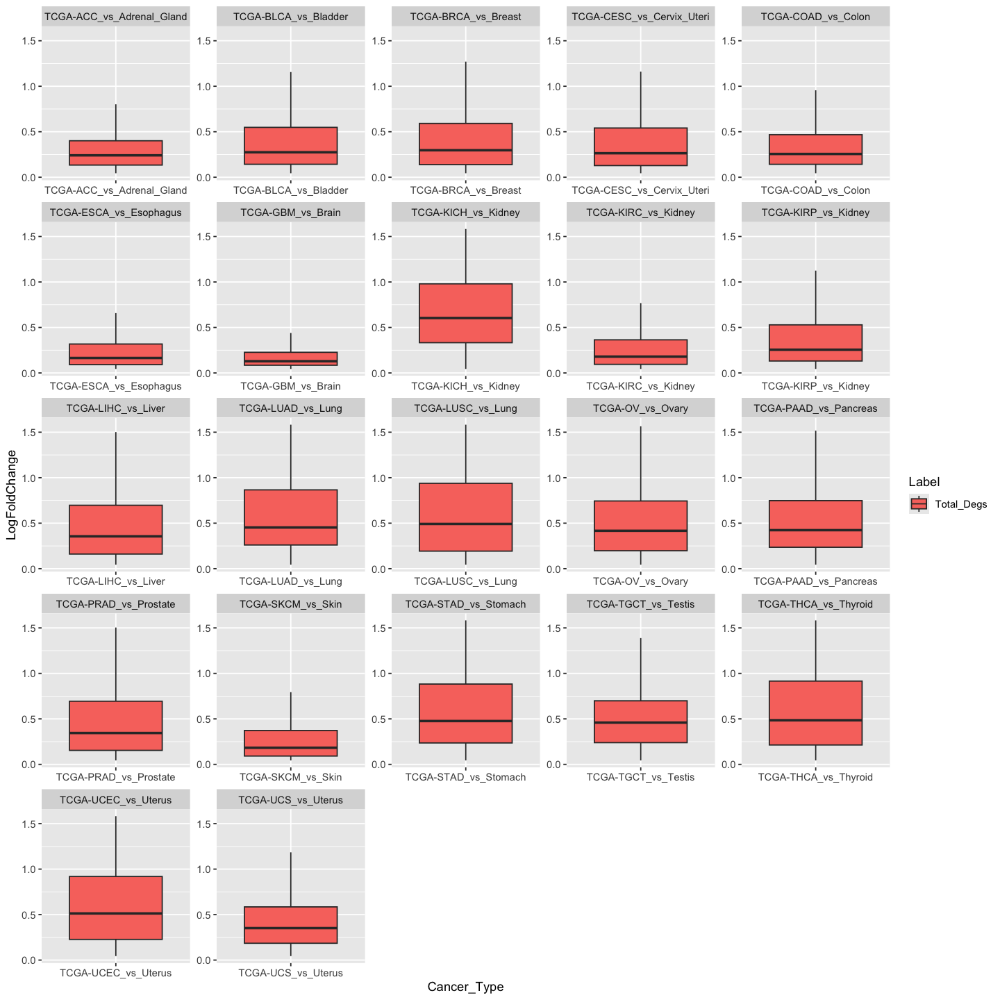

Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

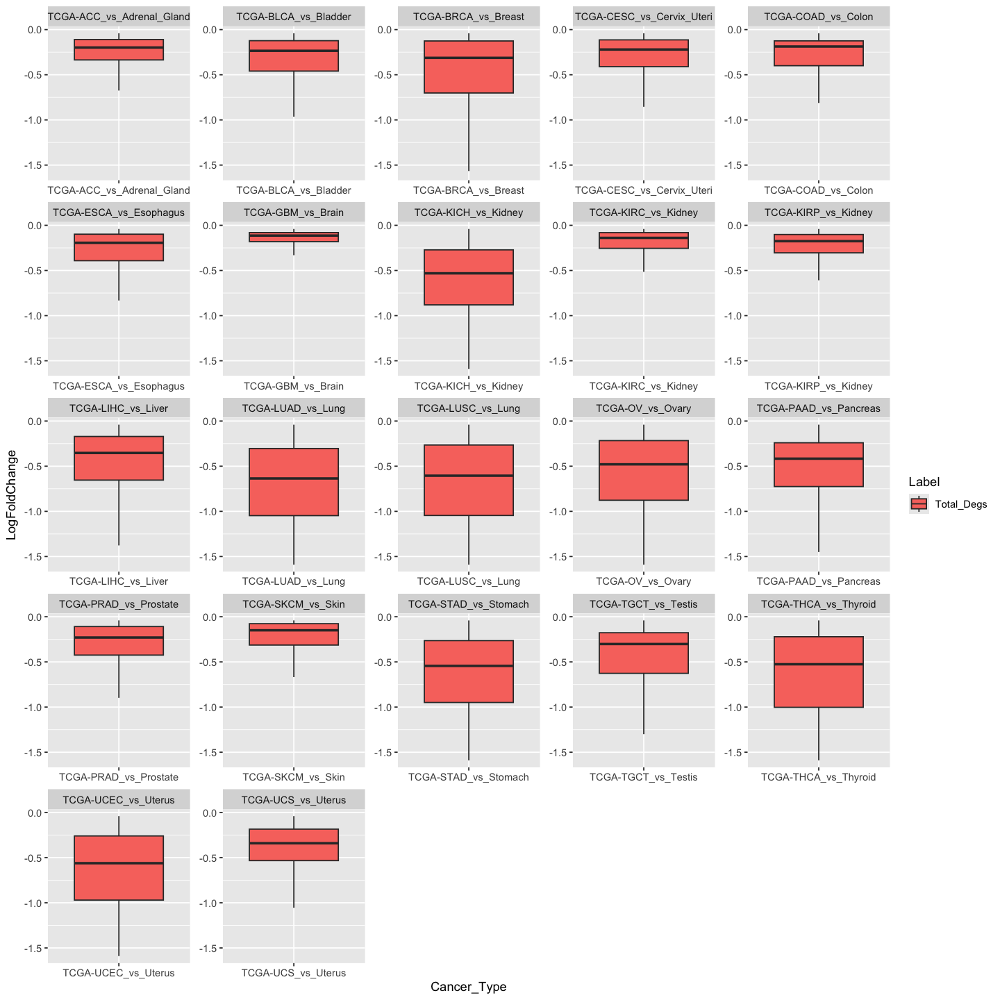

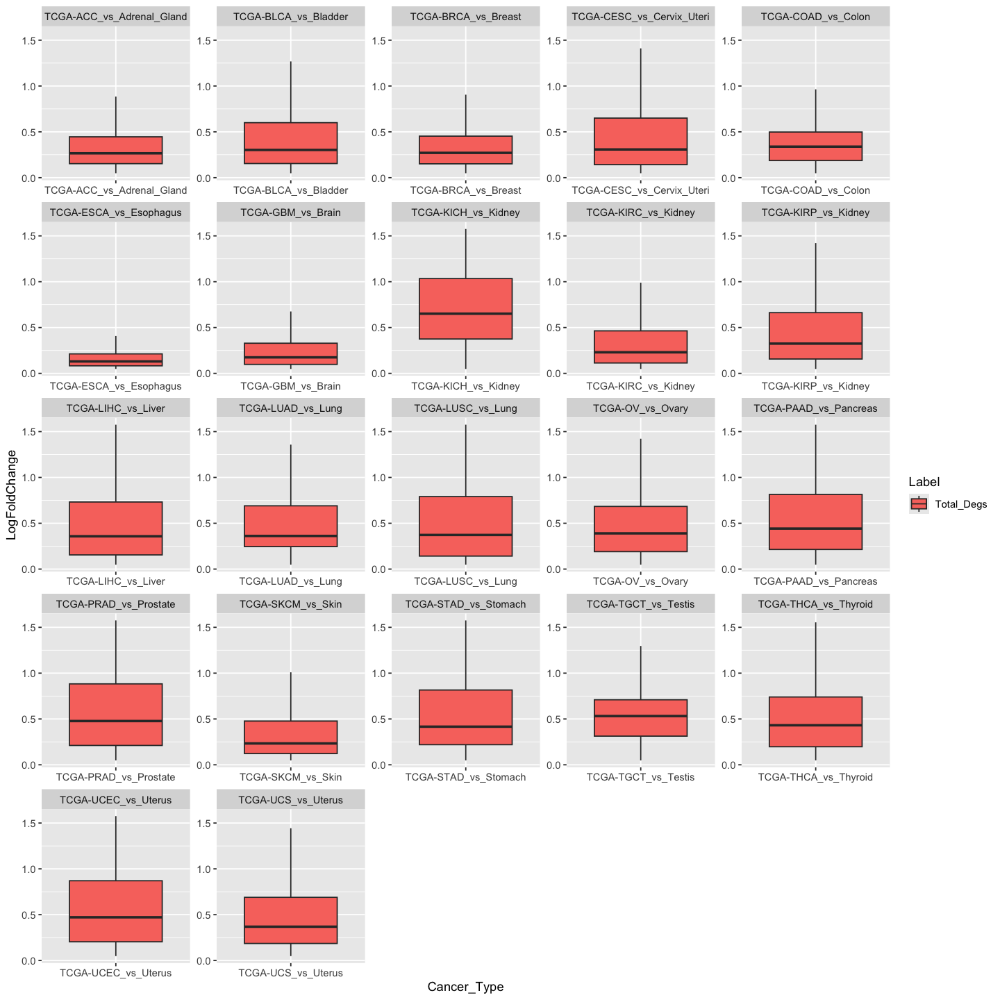

In [119]:
regen_up_dfs <- get_deg_dfs(regen_upregulated_gene_list)

ggplot(regen_up_dfs$abs, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(regen_up_dfs$abs$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(regen_up_dfs$neg, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(regen_up_dfs$neg$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(regen_up_dfs$pos, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(regen_up_dfs$pos$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

[1] "Total Degs 44936"
[1] "Fraction of WRS gene in TCGA-OV_vs_Ovary with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 25% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 25% 0"
[1] "#############################################################"
[1] "Total Degs 41584"
[1] "Fraction of WRS gene in TCGA-UCS_vs_Uterus with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0

Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

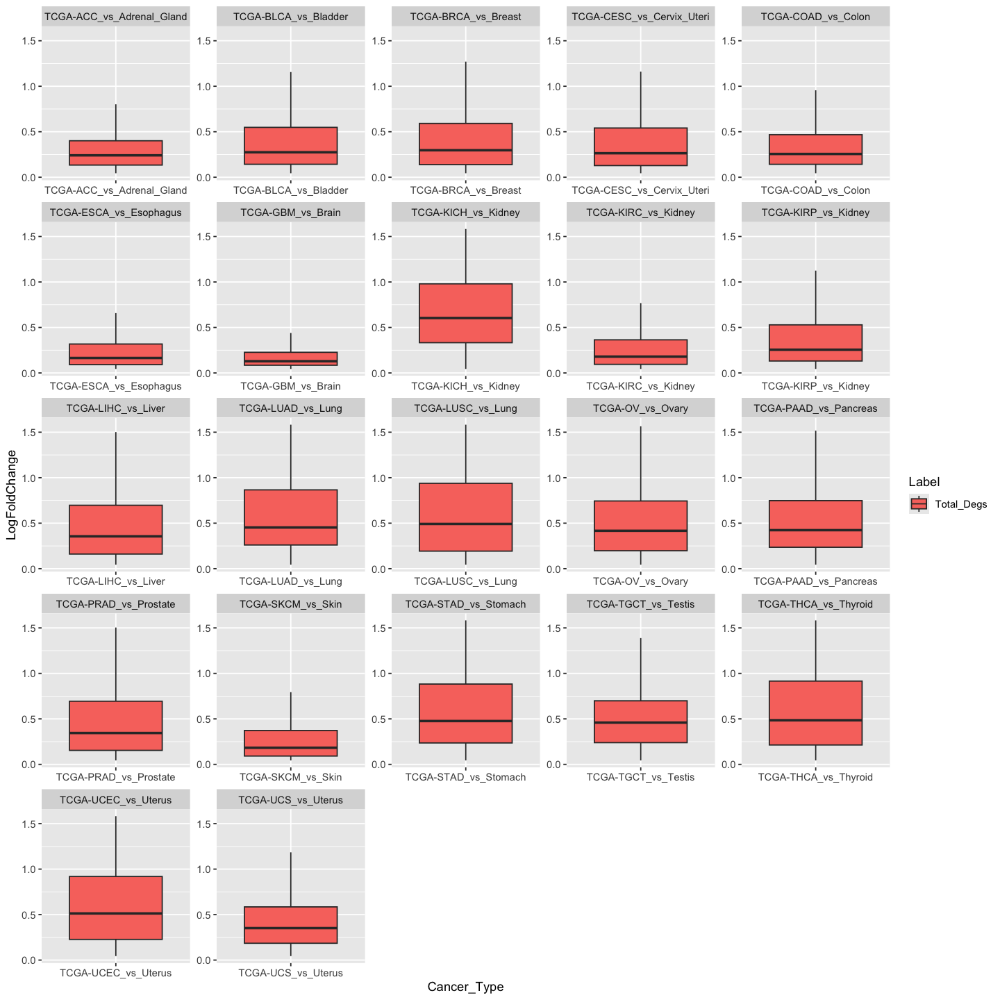

Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

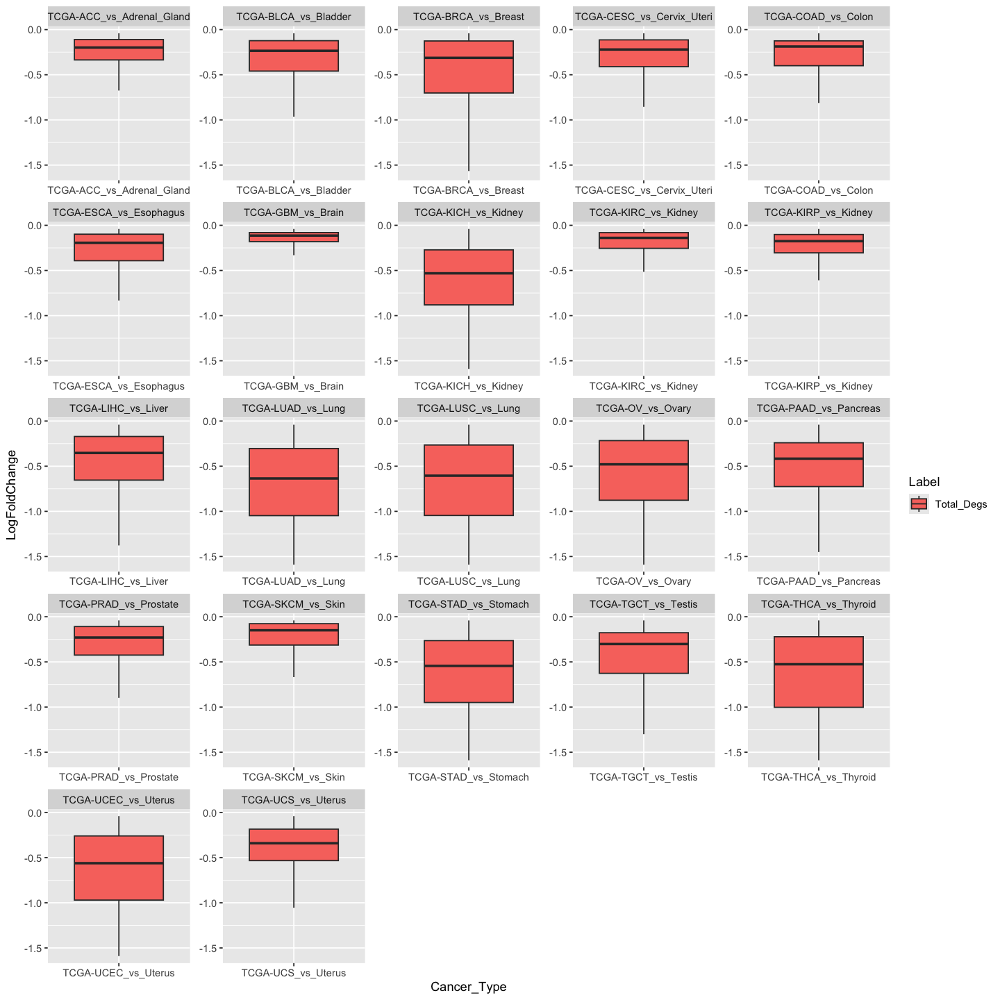

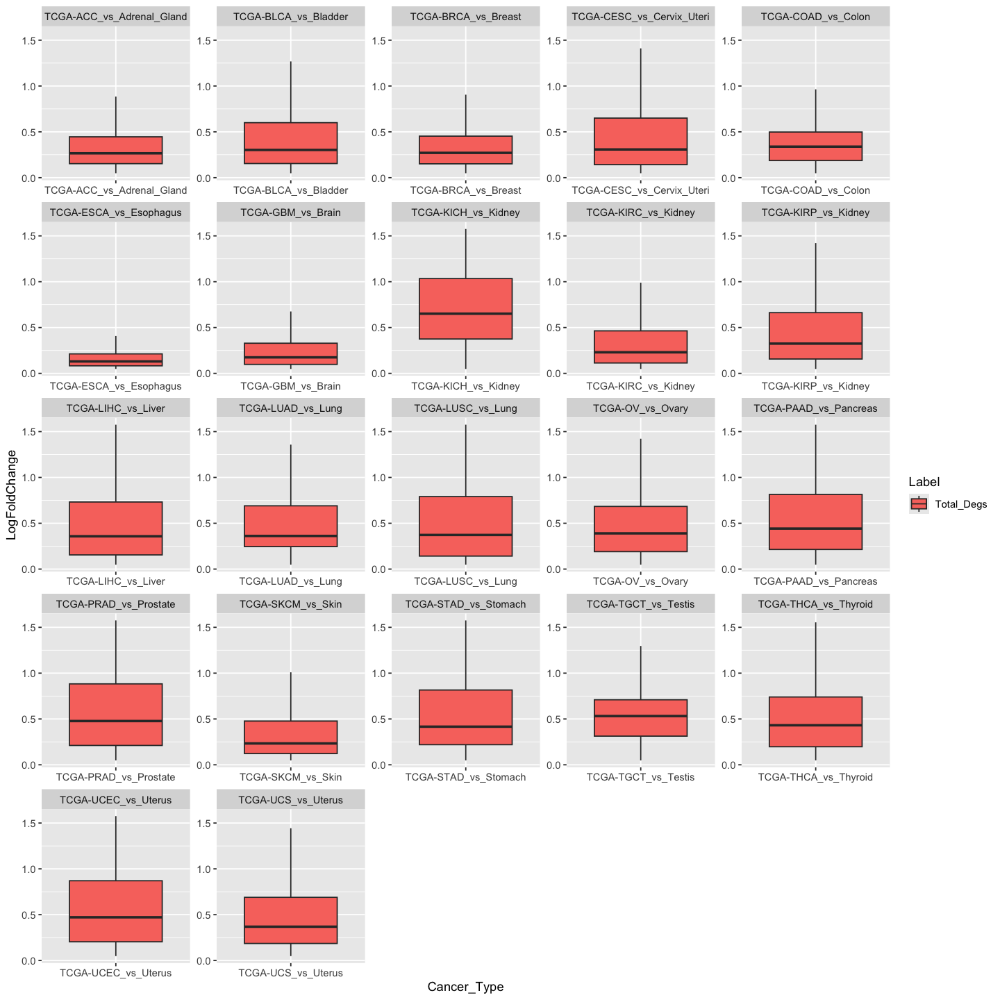

In [120]:
regen_down_dfs <- get_deg_dfs(regen_downregulated_gene_list)

ggplot(regen_down_dfs$abs, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(regen_down_dfs$abs$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(regen_down_dfs$neg, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(regen_down_dfs$neg$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(regen_down_dfs$pos, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(regen_down_dfs$pos$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

[1] "Total Degs 44936"
[1] "Fraction of WRS gene in TCGA-OV_vs_Ovary with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 25% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 25% 0"
[1] "#############################################################"
[1] "Total Degs 41584"
[1] "Fraction of WRS gene in TCGA-UCS_vs_Uterus with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0

Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

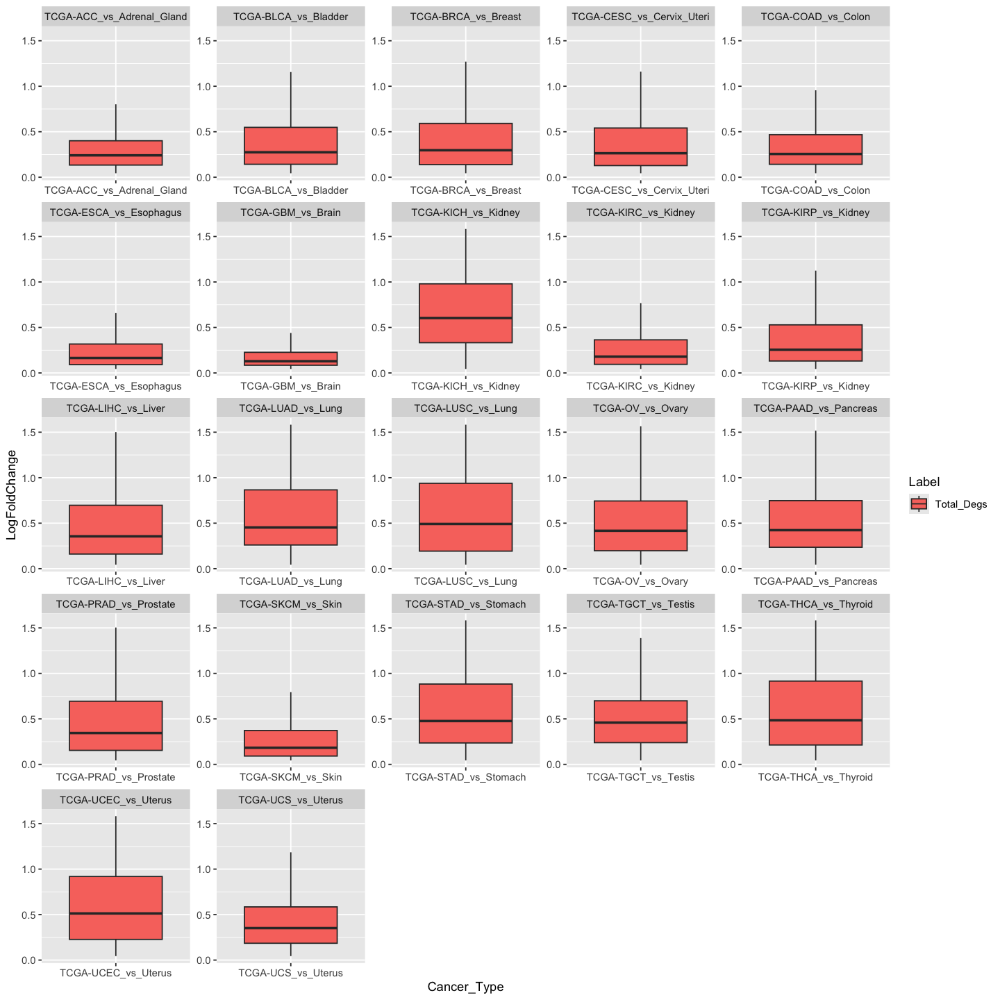

Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

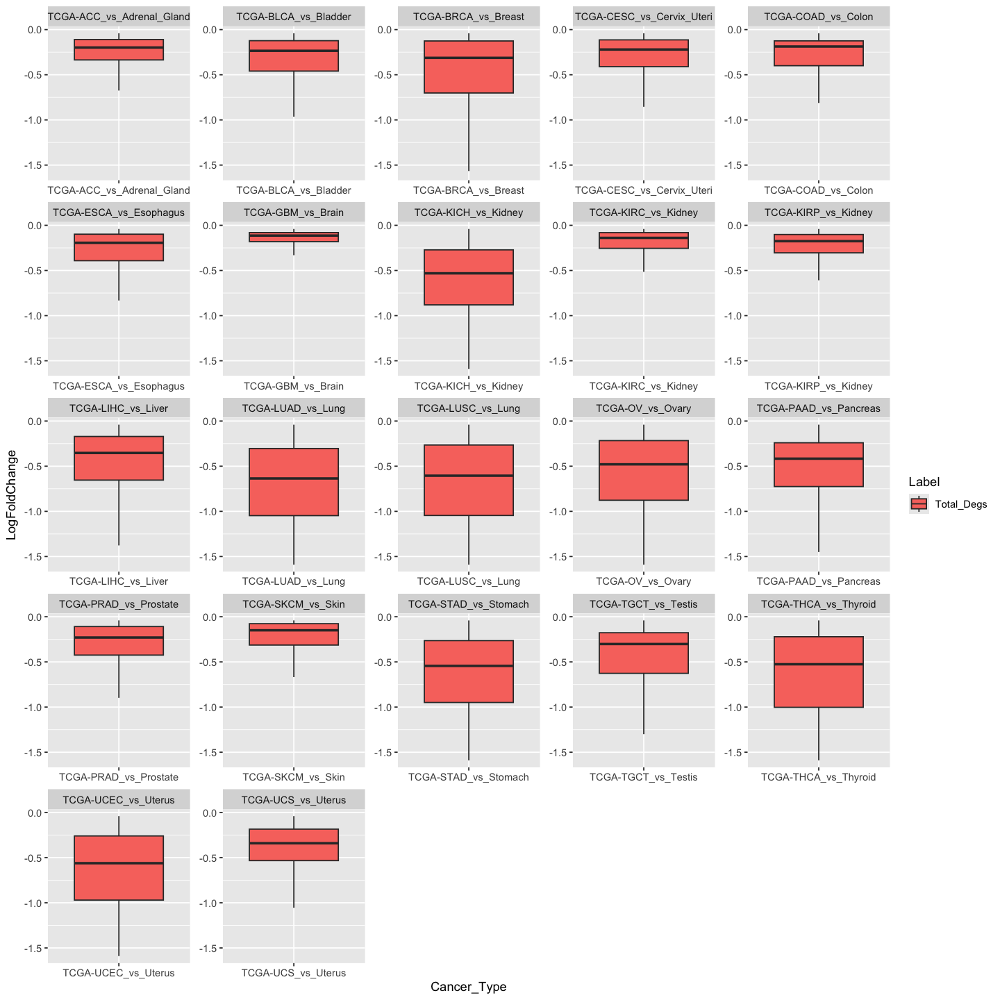

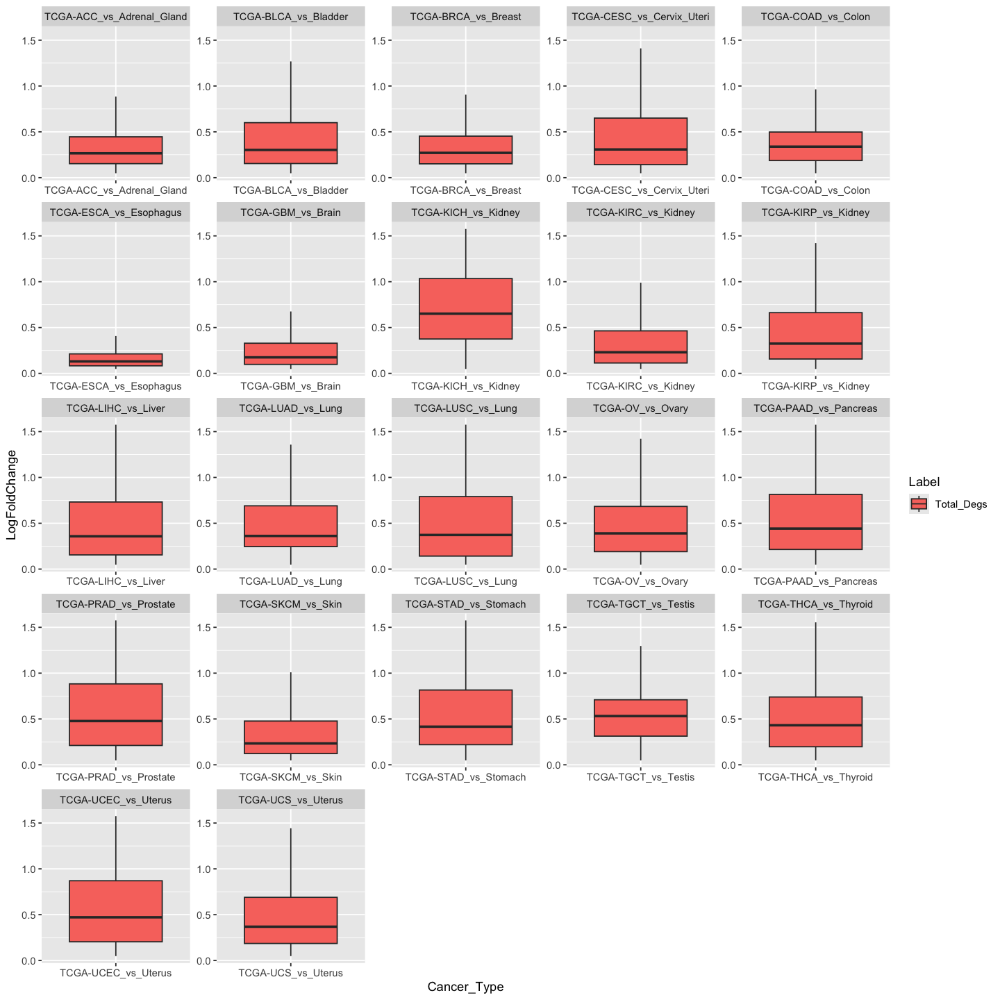

In [121]:
wound_up_dfs <- get_deg_dfs(wound_upregulated_gene_list)

ggplot(wound_up_dfs$abs, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(wound_up_dfs$abs$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(wound_up_dfs$neg, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(wound_up_dfs$neg$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(wound_up_dfs$pos, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(wound_up_dfs$pos$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

[1] "Total Degs 44936"
[1] "Fraction of WRS gene in TCGA-OV_vs_Ovary with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 25% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 25% 0"
[1] "#############################################################"
[1] "Total Degs 41584"
[1] "Fraction of WRS gene in TCGA-UCS_vs_Uterus with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0

Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

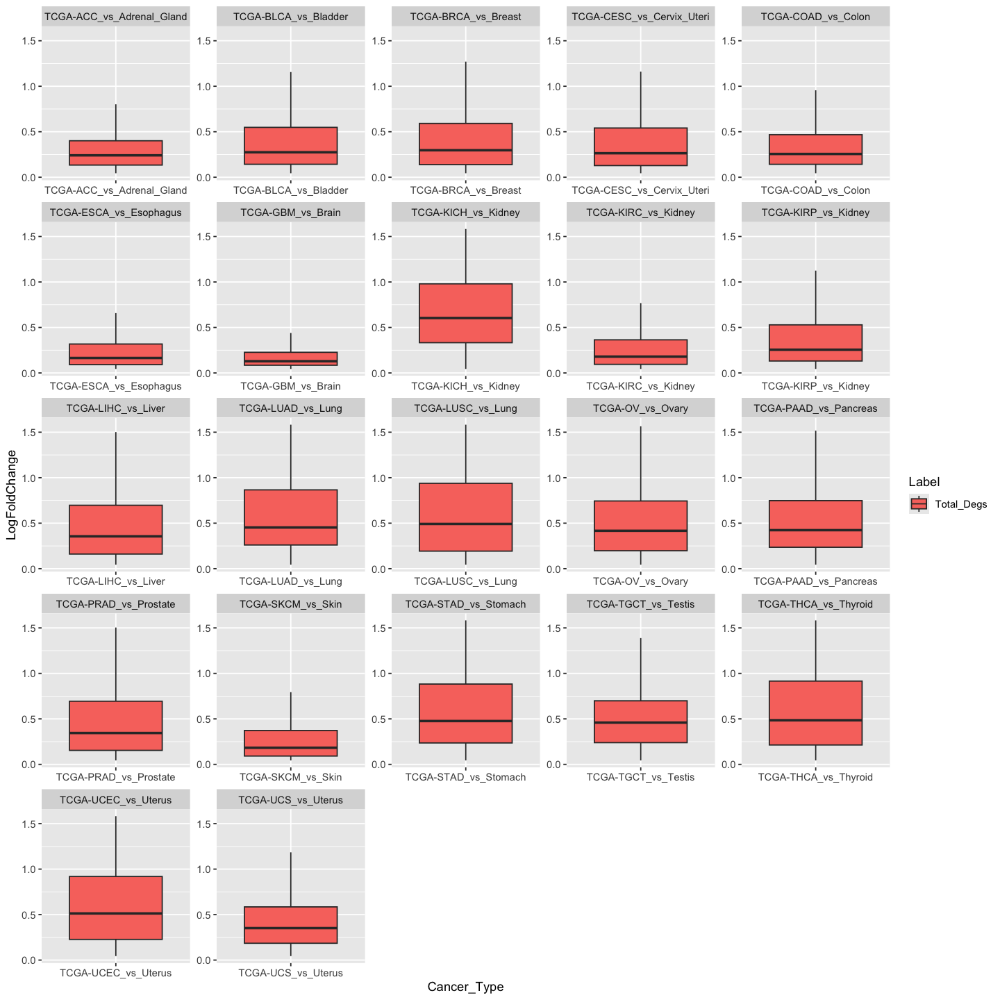

Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

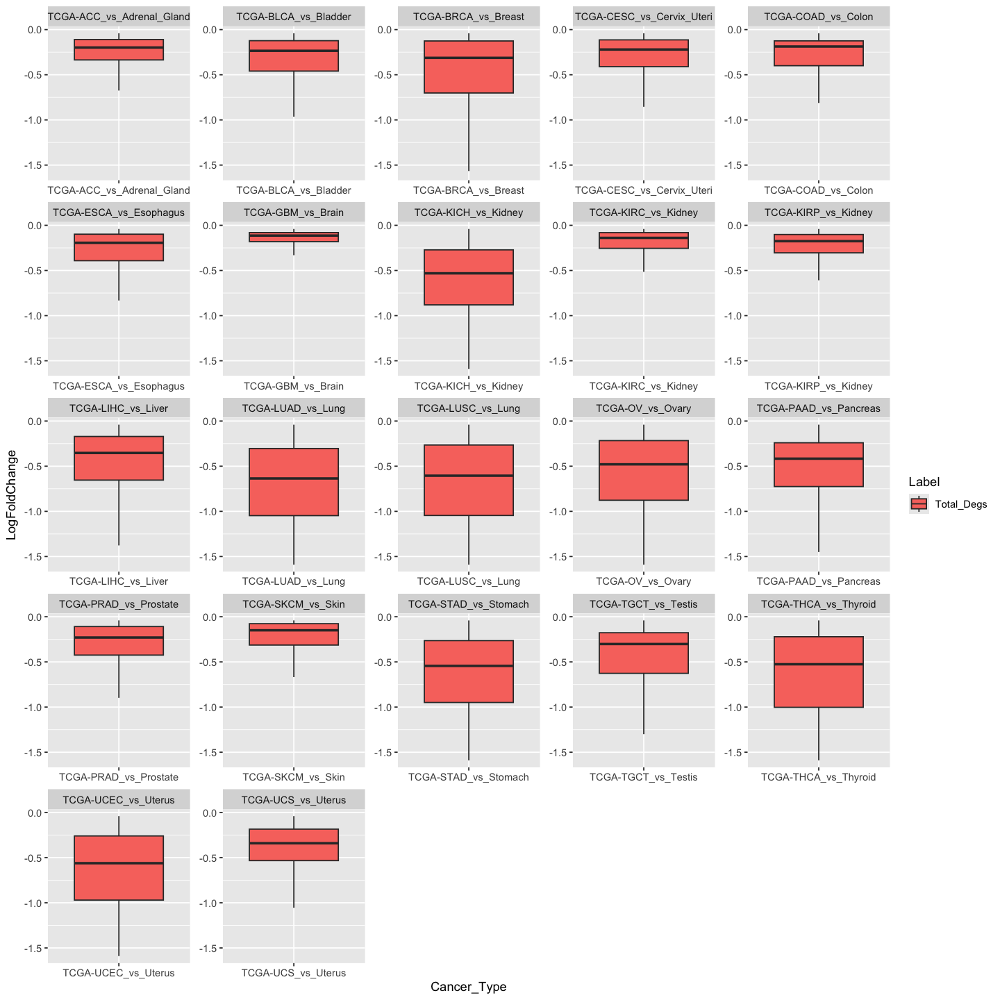

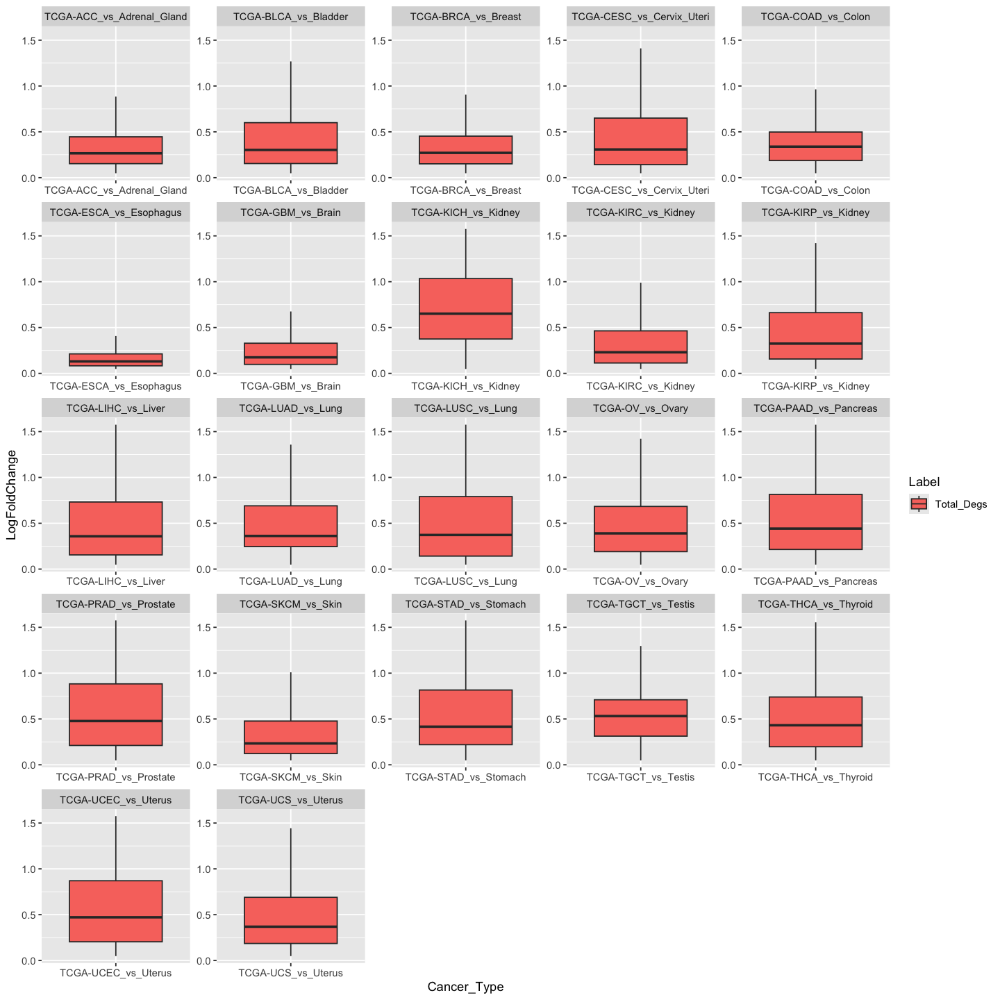

In [122]:
wound_down_dfs <- get_deg_dfs(wound_downregulated_gene_list)

ggplot(wound_down_dfs$abs, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(wound_down_dfs$abs$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(wound_down_dfs$neg, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(wound_down_dfs$neg$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(wound_down_dfs$pos, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(wound_down_dfs$pos$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

[1] "Total Degs 44936"
[1] "Fraction of WRS gene in TCGA-OV_vs_Ovary with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 25% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 25% 0"
[1] "#############################################################"
[1] "Total Degs 41584"
[1] "Fraction of WRS gene in TCGA-UCS_vs_Uterus with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0

Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

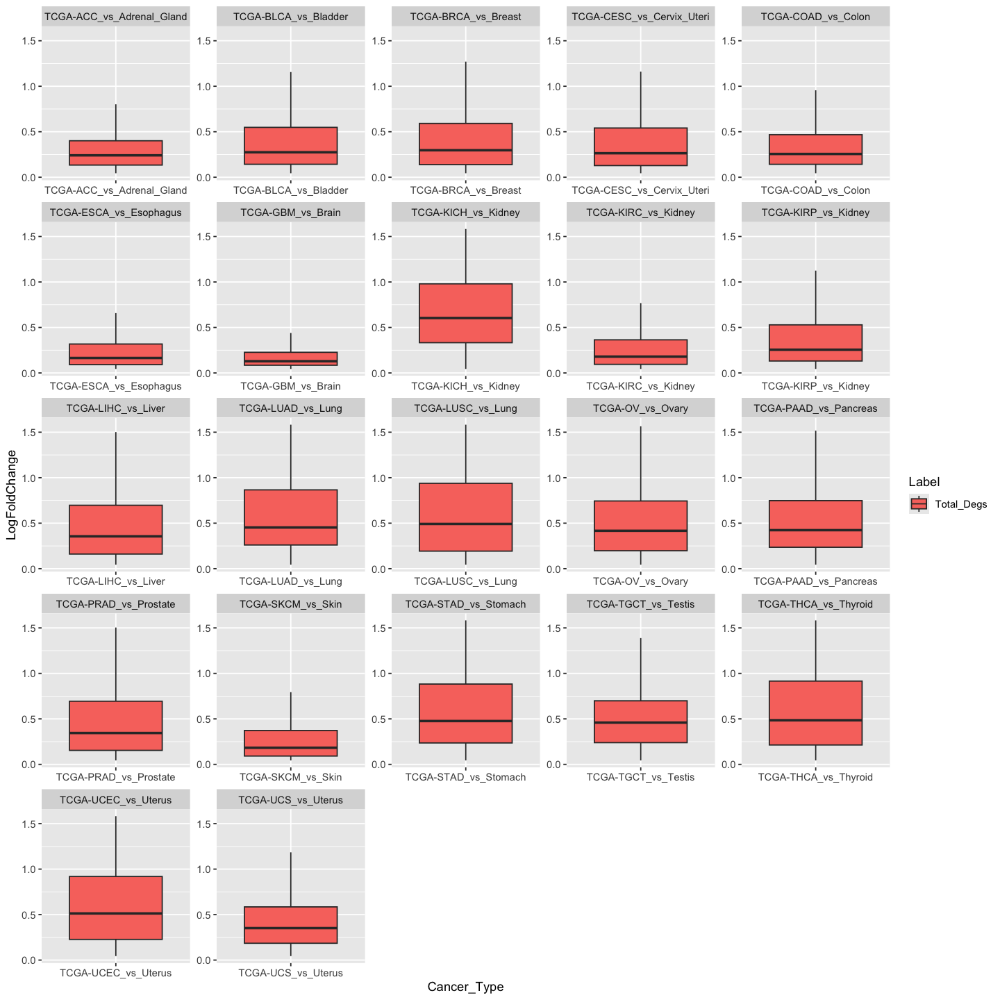

Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

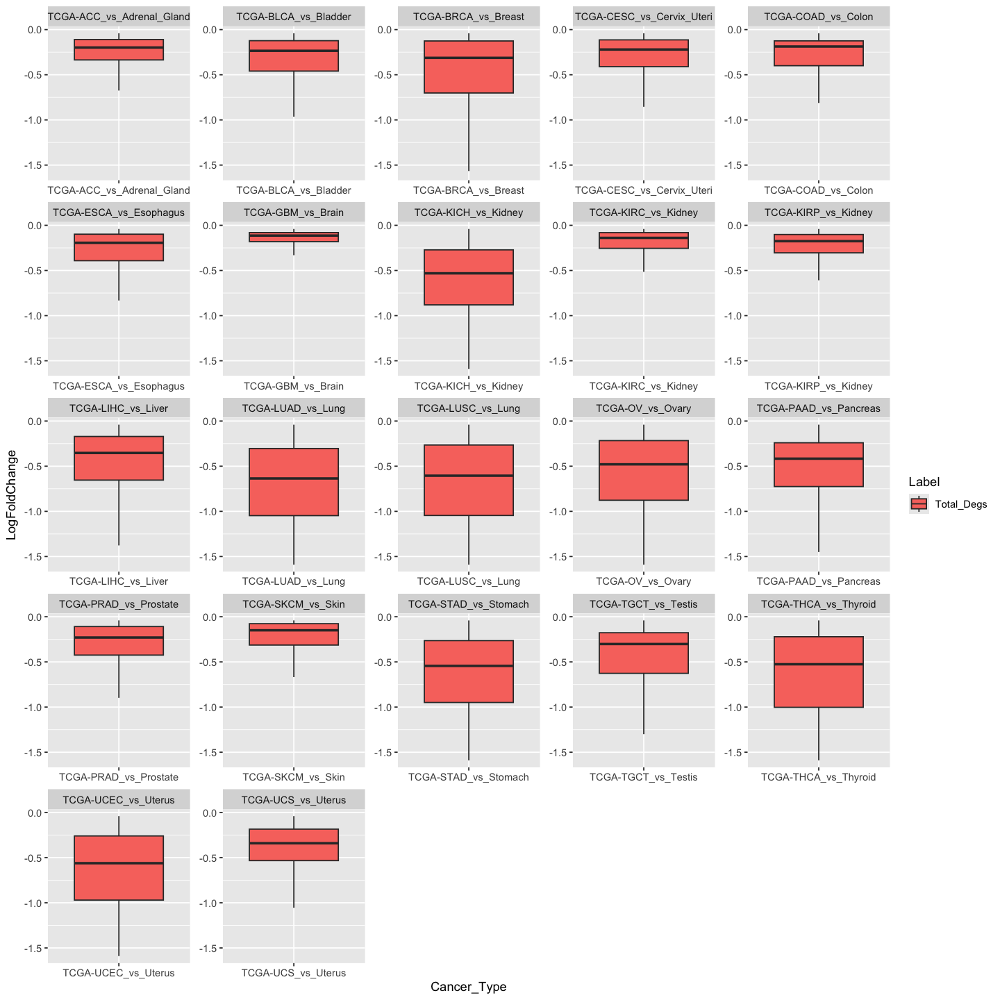

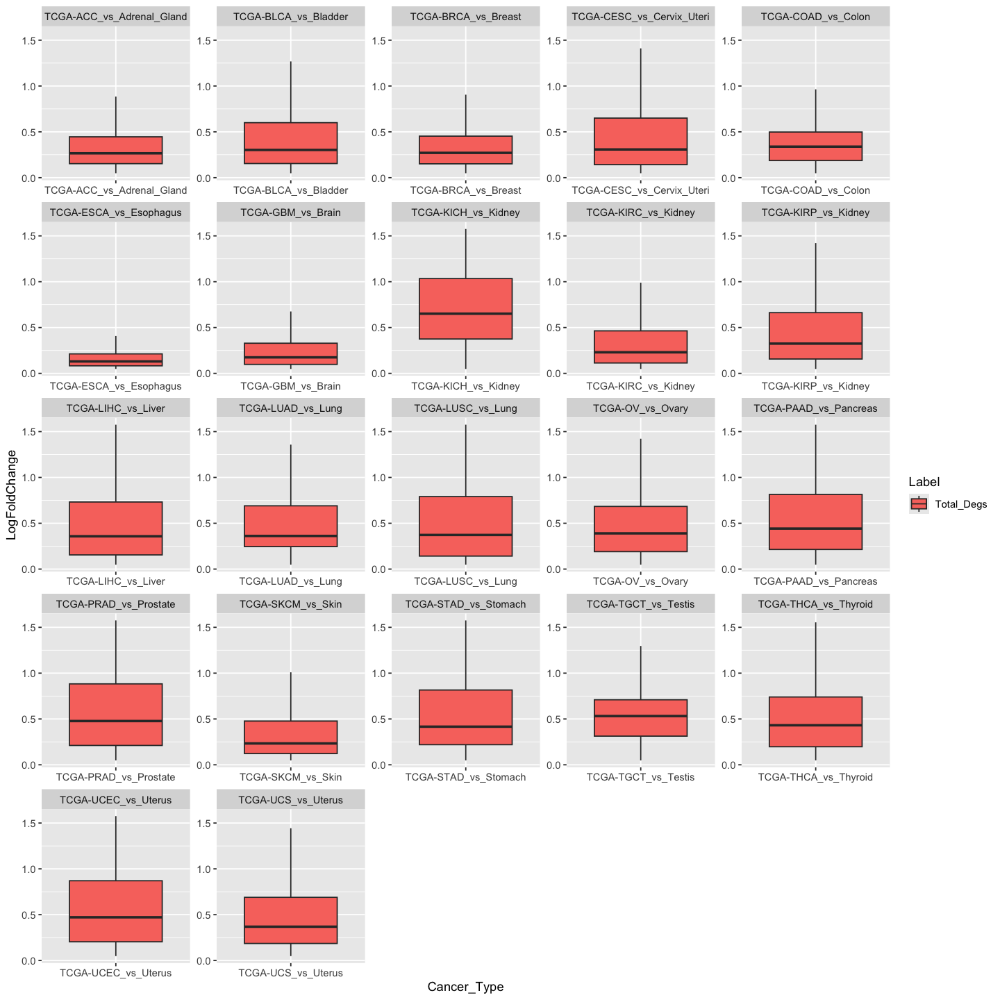

In [123]:
stress_up_dfs <- get_deg_dfs(stress_upregulated_gene_list)

ggplot(stress_up_dfs$abs, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(stress_up_dfs$abs$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(stress_up_dfs$neg, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(stress_up_dfs$neg$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(stress_up_dfs$pos, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(stress_up_dfs$pos$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

[1] "Total Degs 44936"
[1] "Fraction of WRS gene in TCGA-OV_vs_Ovary with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 25% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 25% 0"
[1] "#############################################################"
[1] "Total Degs 41584"
[1] "Fraction of WRS gene in TCGA-UCS_vs_Uterus with significant LFC: 0"
[1] "Ratio of positive to negative HRs NaN"
[1] "Ratio of Percentage of WRS genes greater than the top 5% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 5% 0"
[1] "Ratio of Percentage of WRS genes greater than the top 10% 0"
[1] "Ratio of Percentage of WRS genes Less than the bottom 10% 0

Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 198024 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

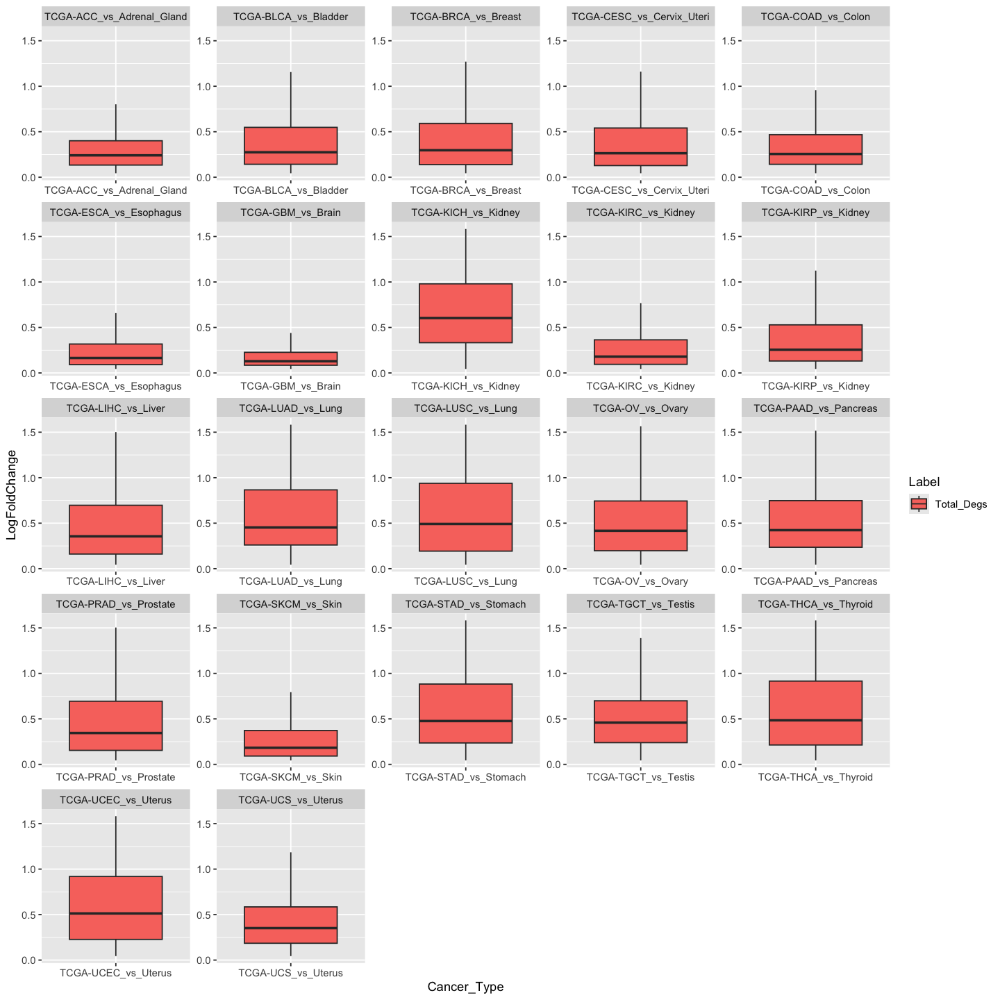

Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_boxplot()`).”
Warning message:
“Removed 100994 rows containing non-finite outside the scale range (`stat_compare_means()`).”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation failed in `stat_compare_means()`.
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Computation fail

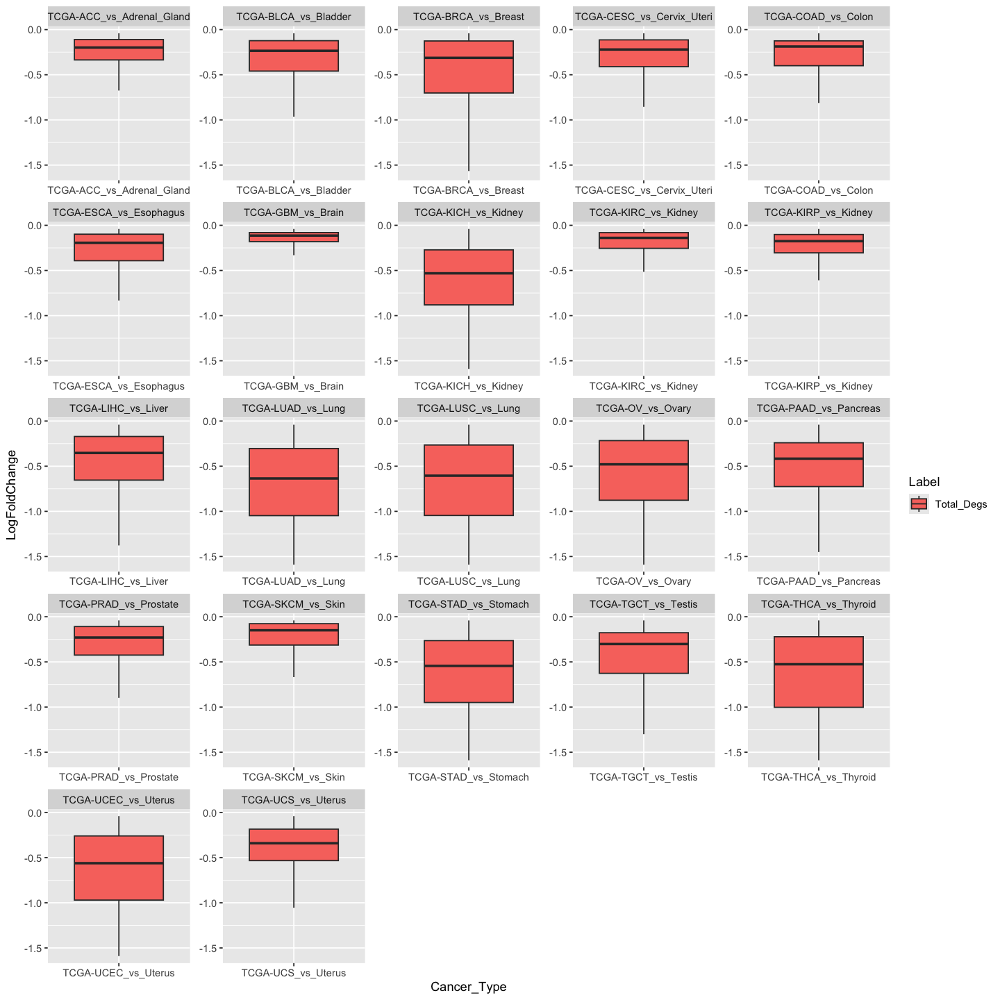

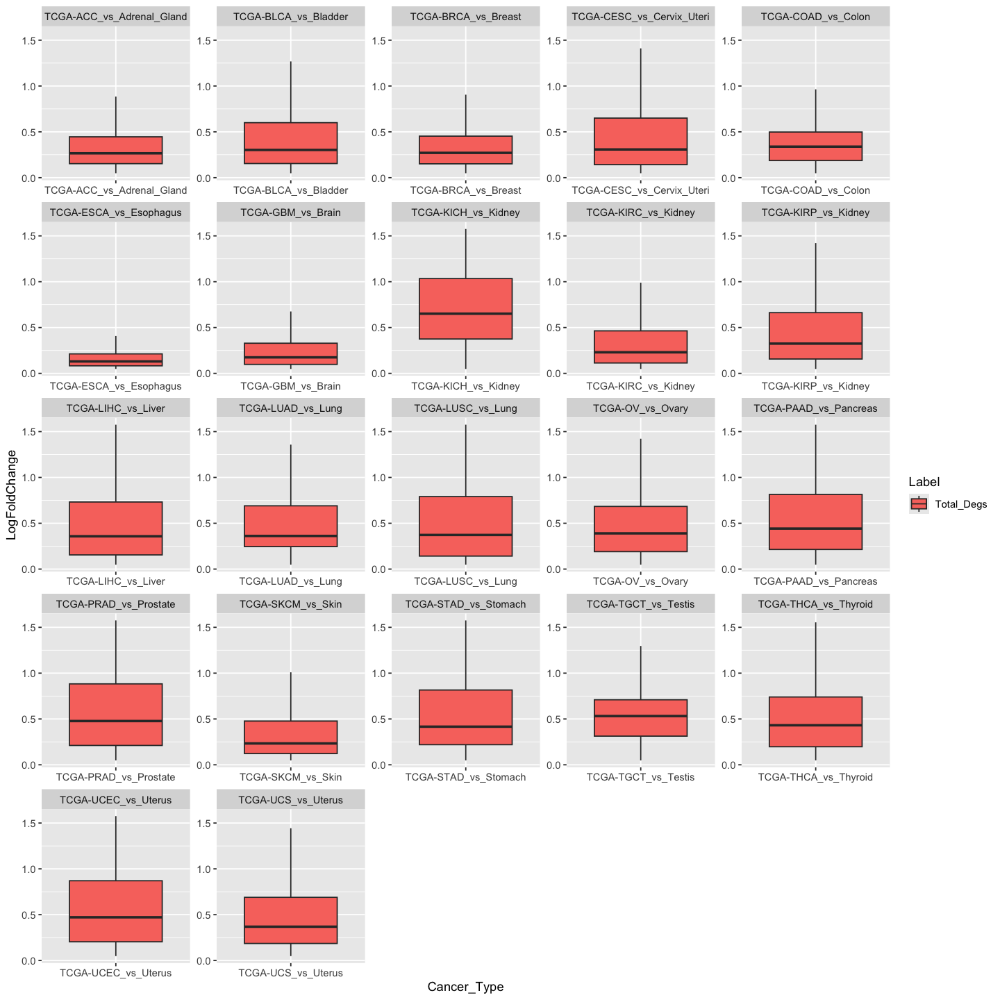

In [124]:
stress_down_dfs <- get_deg_dfs(stress_downregulated_gene_list)

ggplot(stress_up_dfs$abs, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(stress_down_dfs$abs$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(stress_down_dfs$neg, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(stress_down_dfs$neg$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

ggplot(stress_down_dfs$pos, aes(x=Cancer_Type, y=LogFoldChange,
                                   fill=Label)) + 
geom_boxplot(outlier.shape = NA) +
scale_y_continuous(limits = quantile(stress_down_dfs$pos$LogFoldChange, c(0.1, 0.9)))+
facet_wrap(~Cancer_Type, scale="free") +
stat_compare_means(aes(group = Label), label = "p.signif")

In [125]:
downregulated_cancer_genes_1

$`TCGA-OV_vs_Ovary`
   [1] TNMD          CFH           HS3ST1        CYP26B1       RBM5         
   [6] RBM6          CAMKK1        PDK4          ACSM3         PRKAR2B      
  [11] TSPOAP1       SOX8          ASB4          CACNA1G       CCL26        
  [16] NOS2          RHBDF1        LUC7L         SELE          CAMK1G       
  [21] ADAM22        SPAG9         AASS          PGLYRP1       MASP2        
  [26] IFFO1         NISCH         CLCN6         SLC6A7        DCN          
  [31] NR1H4         KDM5D         SLC7A14       CLDN11        CLK1         
  [36] NPC1L1        CLCA1         CLCA4         RUFY3         CNTN1        
  [41] ATP1A2        ADGRA2        CYP3A43       CPS1          FHL1         
  [46] AGPAT4        TIMP2         MYOM2         CYP46A1       TUBG2        
  [51] HOXC8         C6            PHLPP2        RIPOR3        ZPBP         
  [56] TG            EPHA3         YTHDC2        SCML1         ARHGAP6      
  [61] SLC4A8        NRIP2         CBLN4         ITIH4         ITIH1        
  [66] PHF21B        TRAF1         MSH4          FLYWCH1       RPS17P5      
  [71] PRDM6         SLC6A16       CA11          AHRR          CCN5         
  [76] NGFR          CDON          SNCAIP        GLP2R         MYLK         
  [81] SNAP91        ME1           SLC9A3        CLDN18        KIF26A       
  [86] ACSM2B        DDX3Y         TRO           ZFY           SYT1         
  [91] RASGRP2       PYGM          MAOB          RORA          TGFBR3       
  [96] GNB5          ELP1          FGF10         FGF22         FSTL3        
 [101] PTPN21        CAMK2A        ARHGAP10      TRIB2         CDH19        
 [106] SPEG          TRHDE         CRMP1         IRAG1         SCARB1       
 [111] MOV10L1       ADAM11        MOCOS         PLD1          SEC31B       
 [116] ACACB         NMRK2         PAK3          ACTN2         NAALAD2      
 [121] ITGA8         ITM2A         MYH7B         CDH17         FKBP7        
 [126] AFM           SCGN          DCT           SCTR          SESN1        
 [131] CFHR2         CROCCP3       AFP           COL4A4        CACNA1S      
 [136] PCDHB4        MPP4          PGR           TRPM3         DOP1A        
 [141] COL16A1       GCKR          MAPRE3        ABCB1         MAST2        
 [146] PPP1R15A      ACHE          PHACTR3       ASAP3         ANKRD10      
 [151] ARHGAP28      EBF4          F11           P2RX7         SLC23A2      
 [156] SLC8B1        CHGB          HEPH          LAG3          ANKRD24      
 [161] LTBP4         SI            THPO          CHRD          PITPNM2      
 [166] SLC26A4       SLC26A3       RAPGEF4       MAP3K20       MYO15A       
 [171] NLRP1         PITPNM3       SLC17A6       CPA1          RGS17        
 [176] JPH4          MYH7          SEMA6A        TYRO3         NXPE1        
 [181] WHRN          PDE6C         SEMA4G        BTAF1         TDRD1        
 [186] BAMBI         FKBP5         PGC           PCSK5         ABLIM1       
 [191] HSD17B7P2     CIRBP         CBARP         PCDH11Y       PRKY         
 [196] CDHR5         IZUMO4        GADD45B       SERPIND1      CECR2        
 [201] P2RX6         UPB1          LRP5L         HMOX1         CBX7         
 [206] SYNGR1        FAM118A       TRIM9         DDHD1         CCDC198      
 [211] LRRC74A       SRSF5         PCNX1         PAPLN         EFS          
 [216] DHRS2         NFATC4        VSX1          NINL          SGK2         
 [221] SLCO4A1       COL20A1       SEL1L2        ANGPT4        BPI          
 [226] ASIP          TNNC2         ZNF516        MYOM1         POLI         
 [231] ATP1B4        PRPS2         PAGE4         SRPX          MCF2         
 [236] F9            BMX           SMARCA1       ZC3H12B       PHEX         
 [241] BRS3          KLHL4         SYTL4         DRP2          NALCN        
 [246] CAB39L        DGKH          MEDAG         TSNAXIP1      CBLN1        
 [251] SMPD3         WDR59         TAF1C         CRISPLD2      ZP2          
 [256] AQP8          RRN3P2        XYLT1         CORO

In [126]:
row_labels_deg <- factor(gsub("^.*\\.","",names(combined_recurrent)))
levels(row_labels_deg) <- c("RG", "SR", "WH")
heatmap_annot_deg <- data.frame("Experiment_Type"=row_labels_deg)
rownames(heatmap_annot_deg) <- names(combined_recurrent)

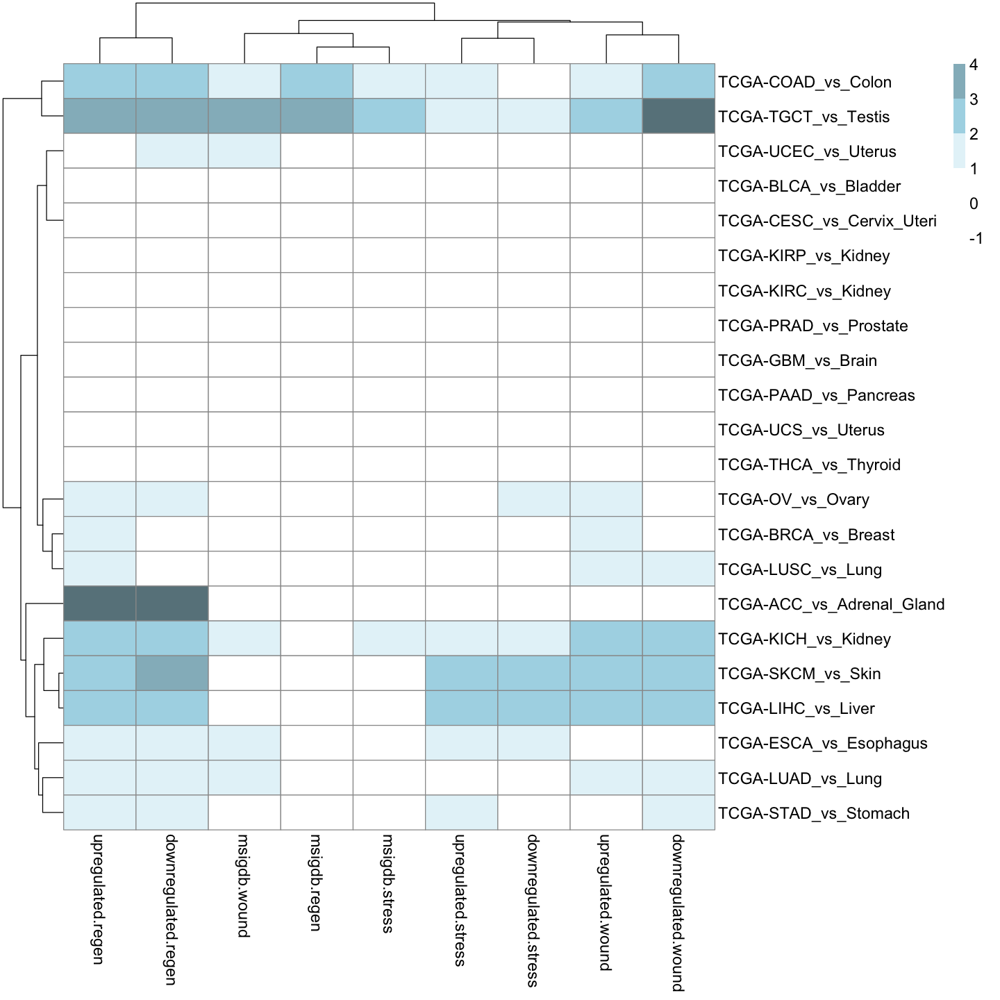

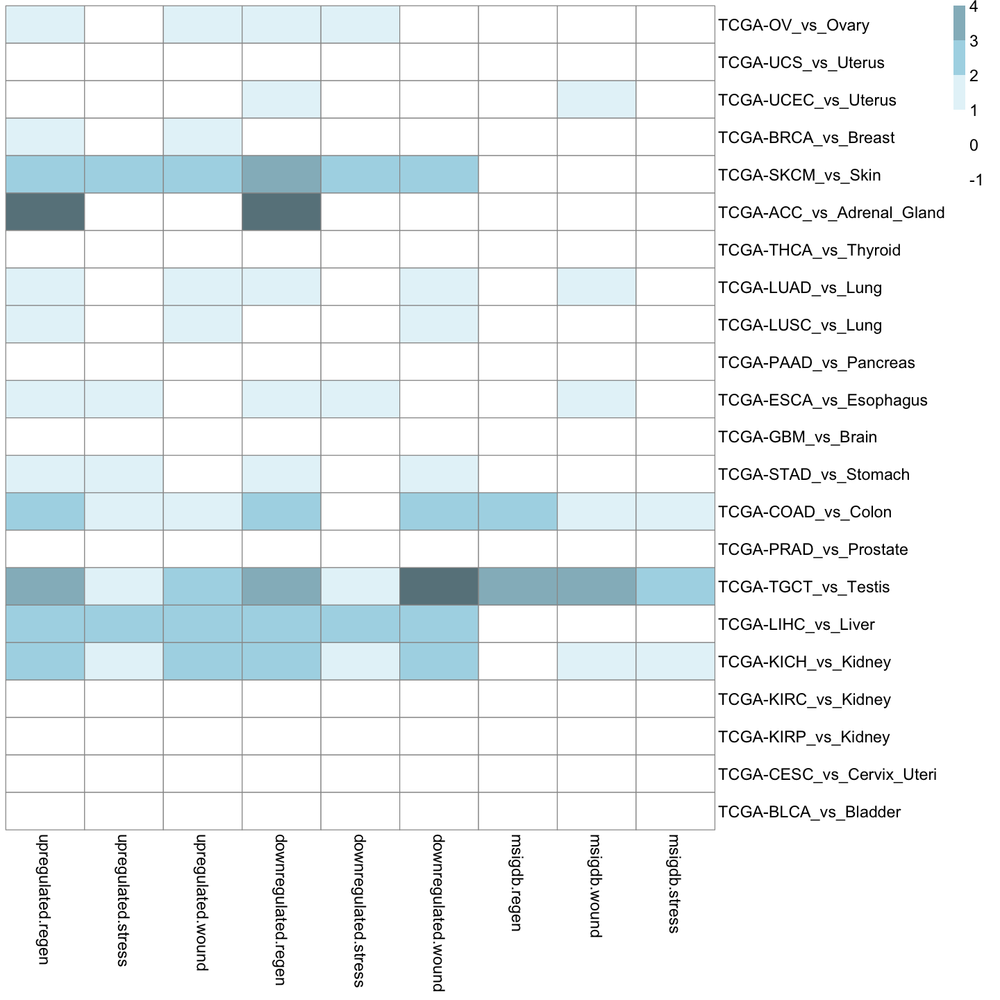

In [127]:
options(repr.plot.width=12, repr.plot.height=12)
total_cancer_down_overlaps <- get_overlap_data(combined_recurrent,
                                               downregulated_cancer_genes_1)

total_cancer_down_overlaps_new <- change_matrix(total_cancer_down_overlaps$matrix, total_cancer_down_overlaps$odds_matrix, -1)

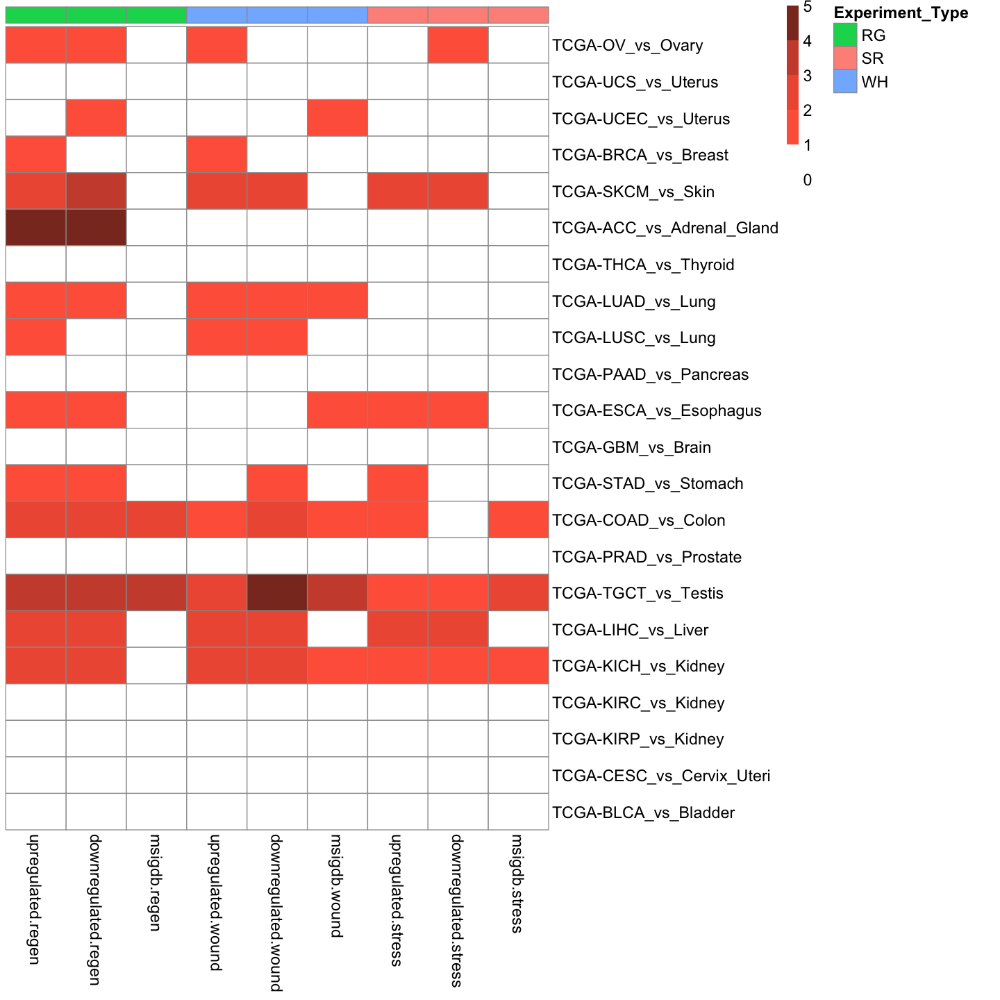

In [128]:
options(repr.plot.width=12, repr.plot.height=12)

pheatmap(total_cancer_down_overlaps_new$matrix[,c('upregulated.regen','downregulated.regen', 'msigdb.regen',
                       'upregulated.wound','downregulated.wound','msigdb.wound',
                       'upregulated.stress','downregulated.stress','msigdb.stress')],
         annotation_col=heatmap_annot_deg, annotation_names_col = F,
         color = colorRampPalette(c("white",'tomato1',"tomato2", "tomato3", "tomato4"))(5),
         fontsize = 14,
         breaks = c(0, 1, 2, 3, 4, 5),cluster_rows=F, cluster_cols=F)

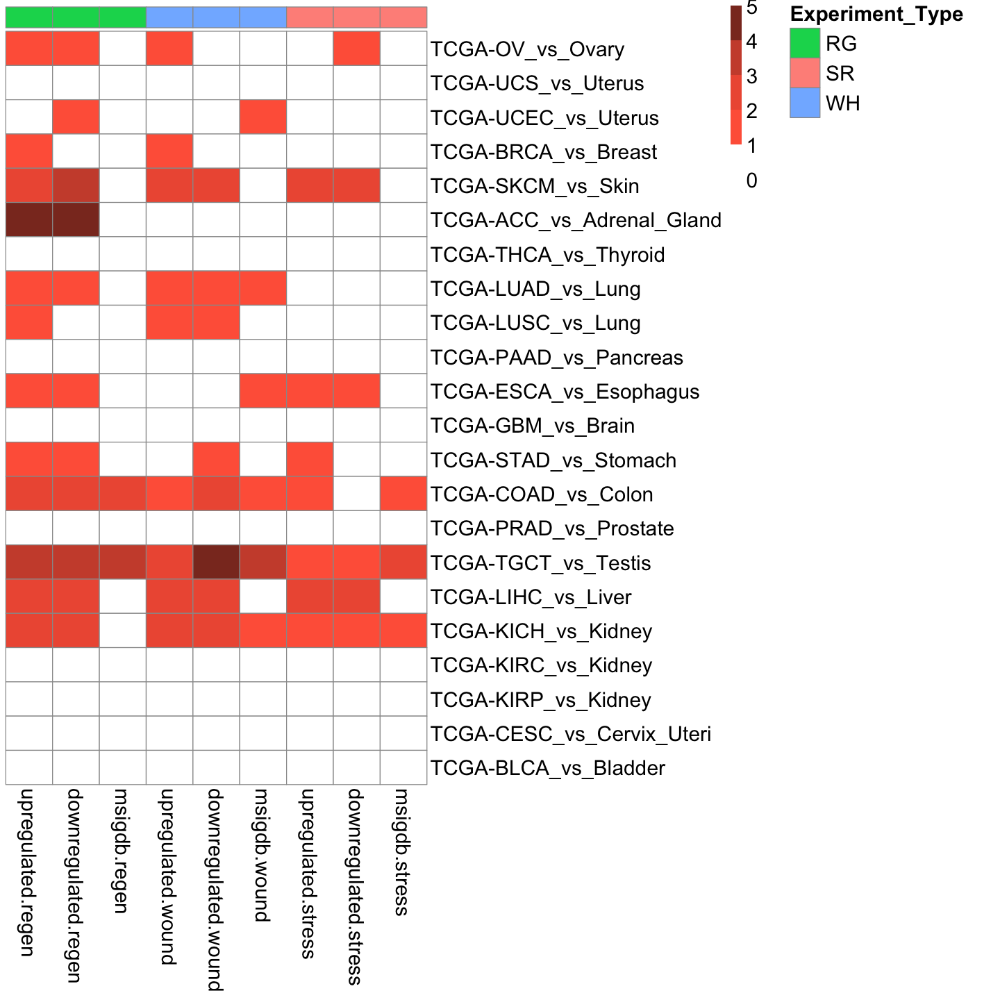

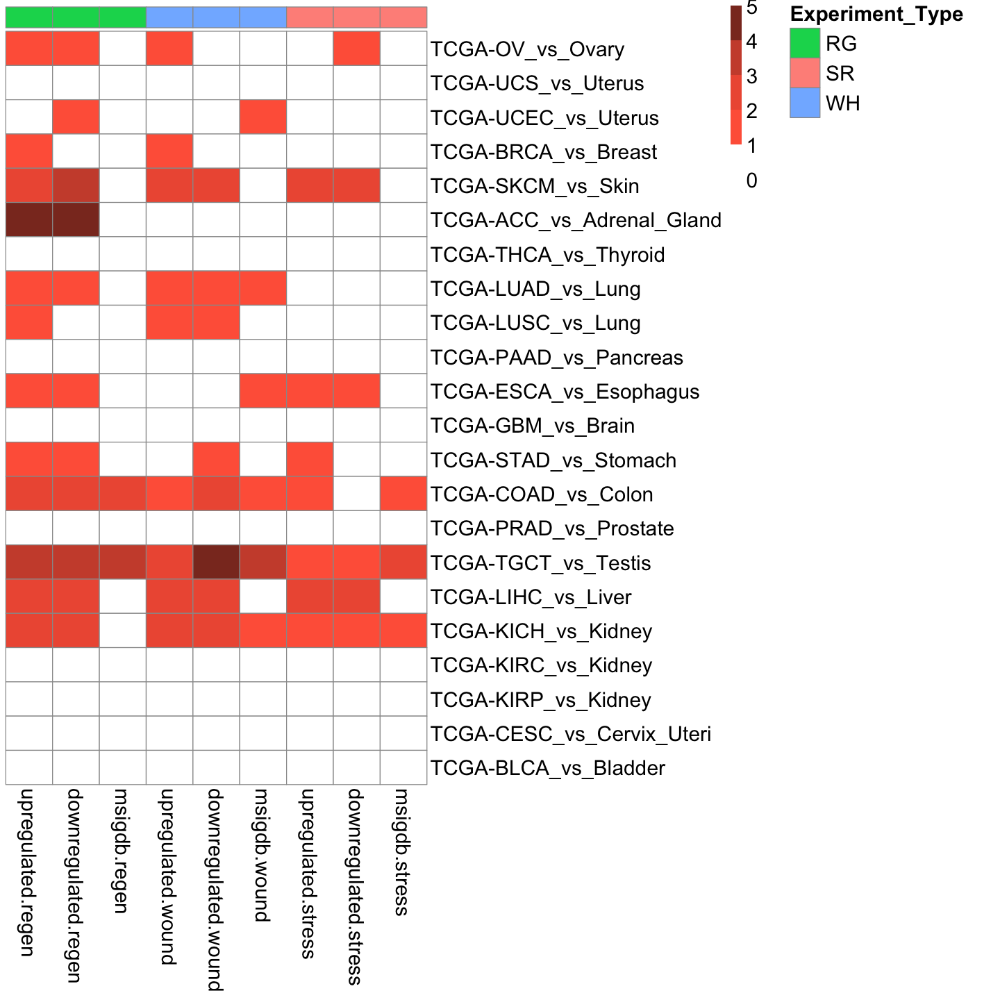

In [129]:
 ### Piyush code to save image
library(pheatmap)
library(grid)
library(ggplot2)

# Capture the plot output
p <- grid::grid.grabExpr(
  pheatmap(total_cancer_down_overlaps_new$matrix[,c('upregulated.regen','downregulated.regen', 'msigdb.regen',
                                                    'upregulated.wound','downregulated.wound','msigdb.wound',
                                                    'upregulated.stress','downregulated.stress','msigdb.stress')],
           annotation_col = heatmap_annot_deg,
           annotation_names_col = FALSE,
           color = colorRampPalette(c("white", "tomato1", "tomato2", "tomato3", "tomato4"))(5),
           fontsize = 18,
           breaks = c(0, 1, 2, 3, 4, 5),
           cluster_rows = FALSE,
           cluster_cols = FALSE)
)

# Save the captured plot using ggsave
#ggsave("/Users/piyushagrawal/Desktop/Down_DEGs_heatmap.pdf", plot = p, width = 12, height = 12, dpi = 600, units = "in")


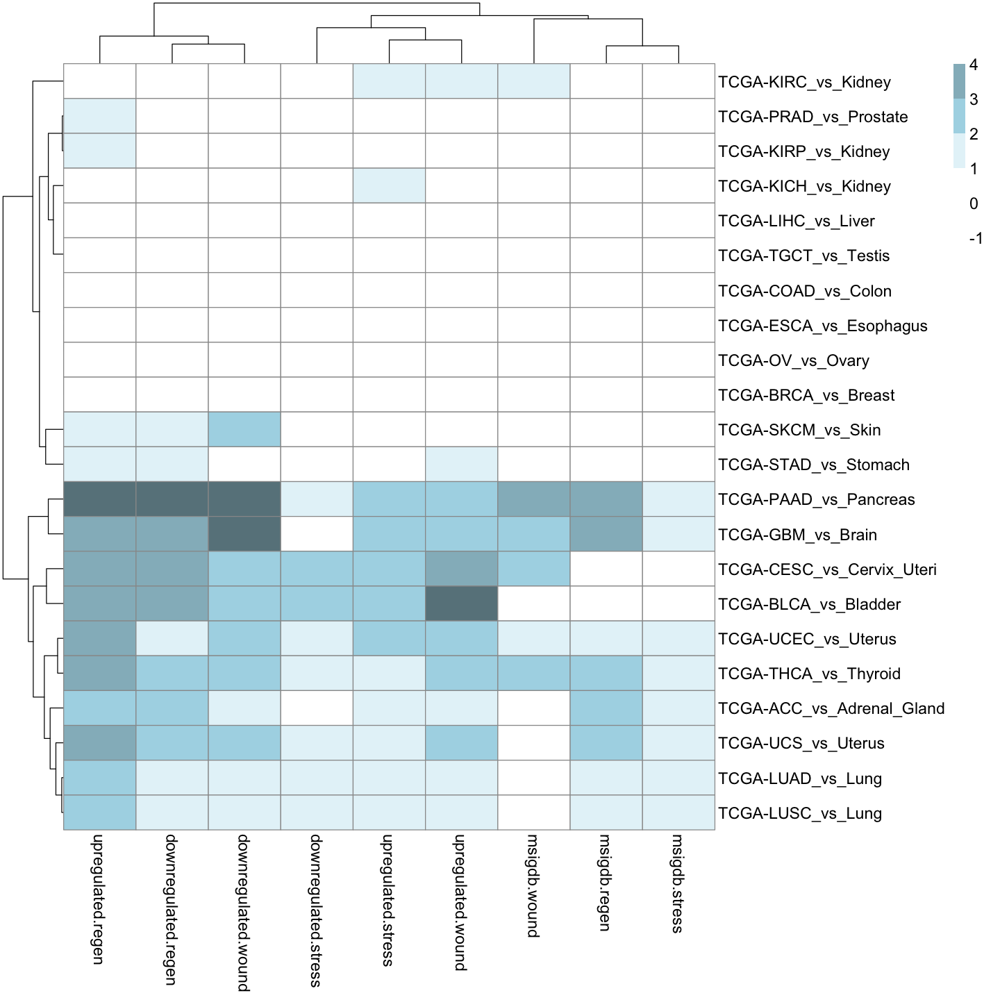

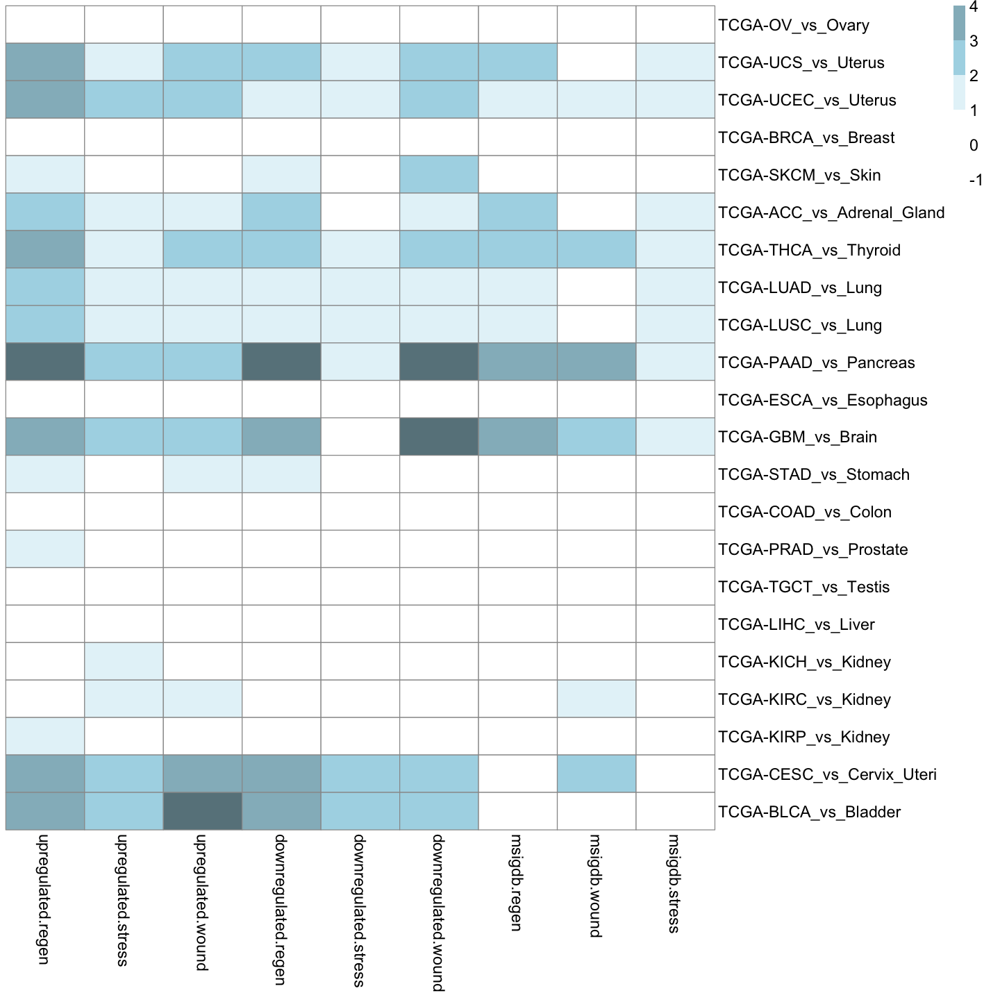

In [130]:
total_cancer_up_overlaps <- get_overlap_data(combined_recurrent,
                                               upregulated_cancer_genes_1)

total_cancer_up_overlaps_new <- change_matrix(total_cancer_up_overlaps$matrix, total_cancer_up_overlaps$odds_matrix, -1)

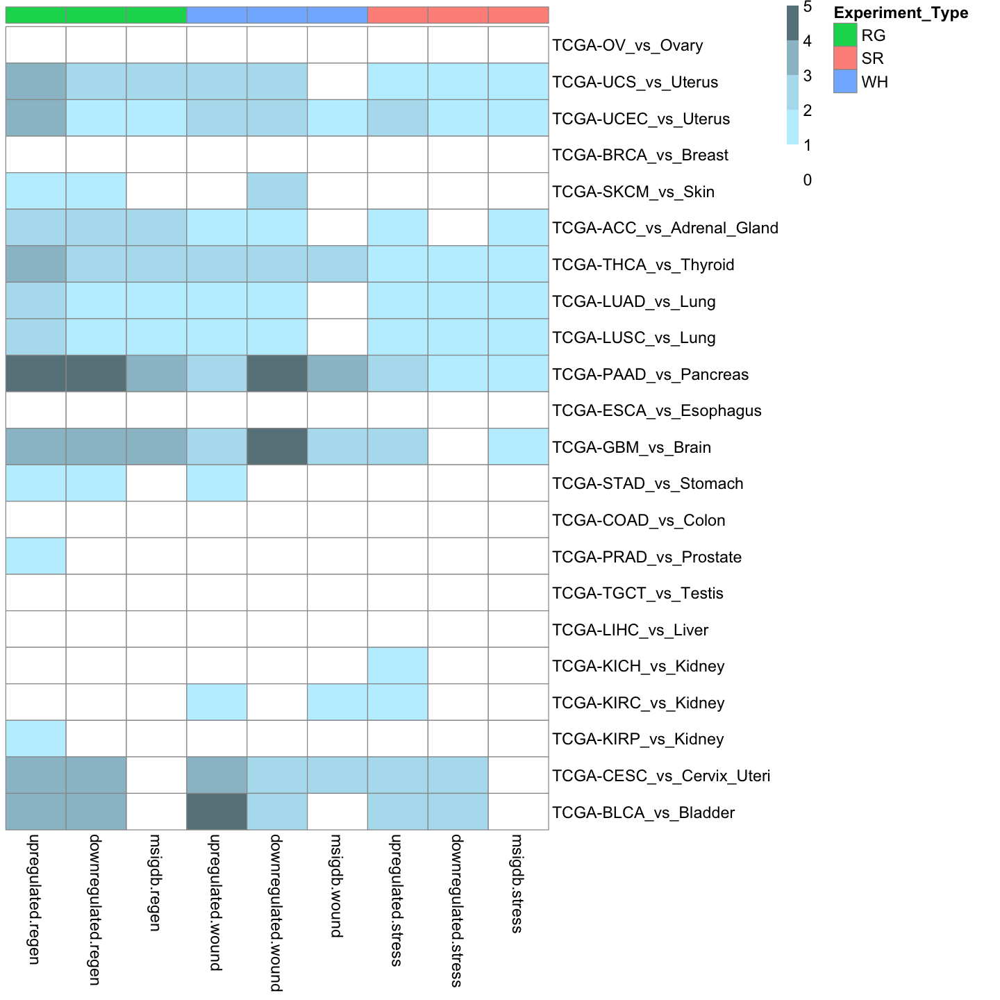

In [131]:
options(repr.plot.width=12, repr.plot.height=12)

pheatmap(total_cancer_up_overlaps_new$matrix[,c('upregulated.regen','downregulated.regen', 'msigdb.regen',
                       'upregulated.wound','downregulated.wound','msigdb.wound',
                       'upregulated.stress','downregulated.stress','msigdb.stress')],
         annotation_col=heatmap_annot_deg, annotation_names_col = F,
         color = colorRampPalette(c("white",'lightblue1',"lightblue2", "lightblue3", "lightblue4"))(5),
         fontsize = 14,
         breaks = c(0, 1, 2, 3, 4, 5),cluster_rows=F, cluster_cols=F)

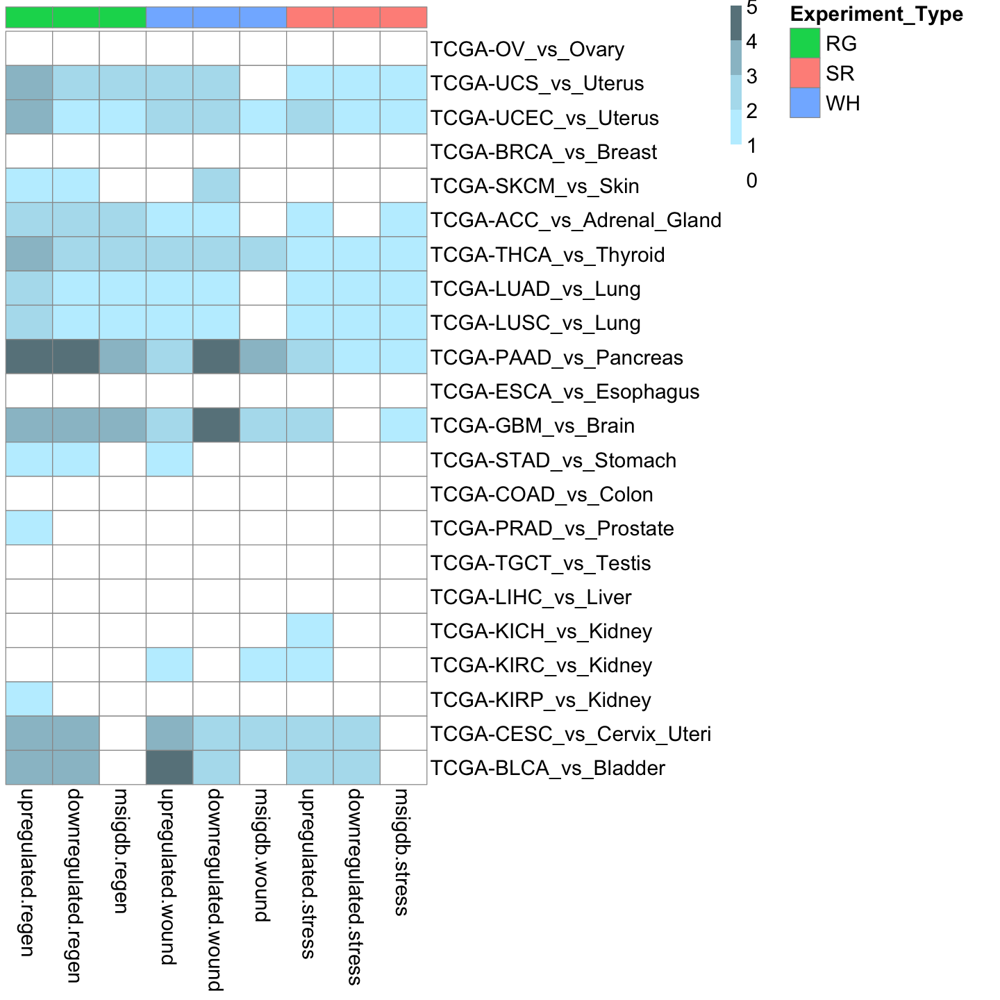

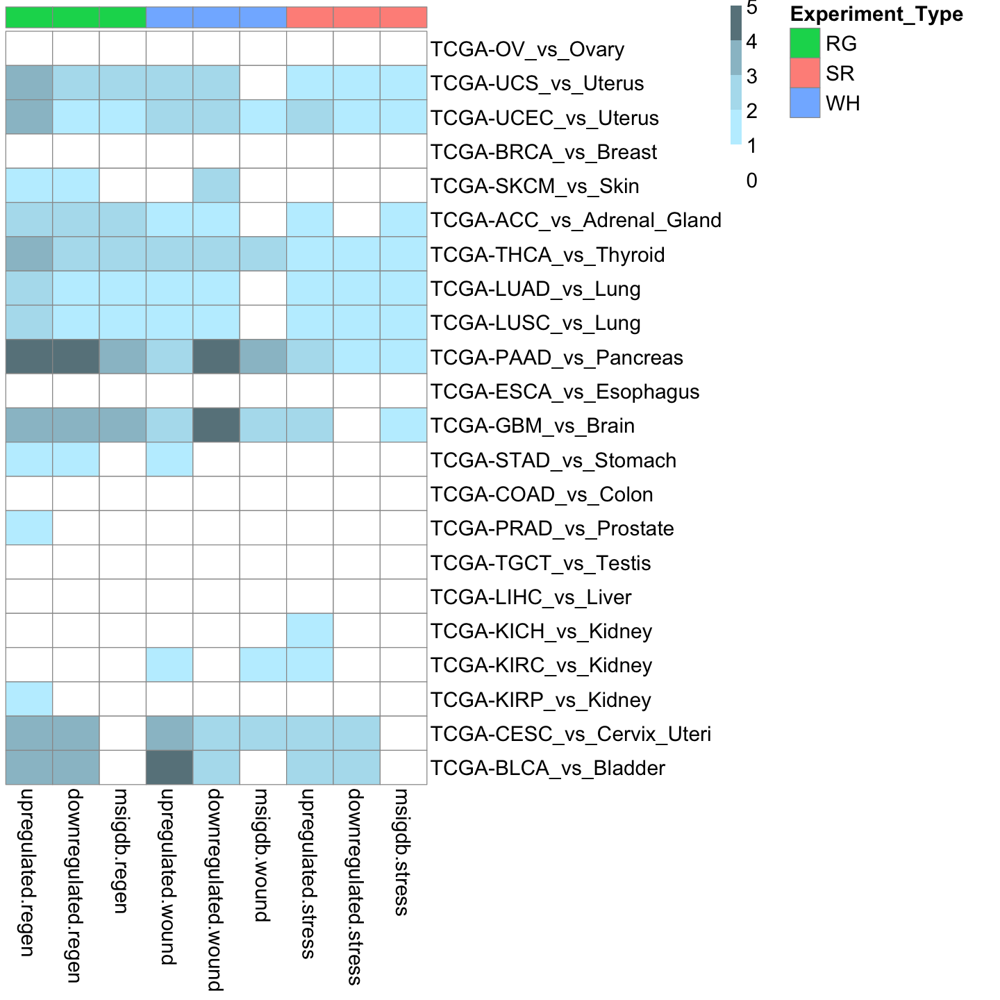

In [132]:
 ### Piyush code to save image
library(pheatmap)
library(grid)
library(ggplot2)

# Capture the plot output
p <- grid::grid.grabExpr(
  pheatmap(total_cancer_up_overlaps_new$matrix[,c('upregulated.regen','downregulated.regen', 'msigdb.regen',
                                                    'upregulated.wound','downregulated.wound','msigdb.wound',
                                                    'upregulated.stress','downregulated.stress','msigdb.stress')],
           annotation_col = heatmap_annot_deg,
           annotation_names_col = FALSE,
           color = colorRampPalette(c("white",'lightblue1',"lightblue2", "lightblue3", "lightblue4"))(5),
           fontsize = 18,
           breaks = c(0, 1, 2, 3, 4, 5),
           cluster_rows = FALSE,
           cluster_cols = FALSE)
)

# Save the captured plot using ggsave
#ggsave("/Users/piyushagrawal/Desktop/Up_DEGs_heatmap.pdf", plot = p, width = 12, height = 12, dpi = 600, units = "in")


In [133]:
### This is where I need to provide my Top2000 and Bottom 2000 predicted gene list ####
predicted_scores_list <- list()
#predicted_scores_list[["High_NonCancer"]] <- fread("../ppi_analysis/extra_files/high_non_cancer.txt", header=F)$V1
#predicted_scores_list[["Goldset_Ccancer"]] <- fread("../ppi_analysis/extra_files/goldset_cancer.txt", header=F)$V1
#predicted_scores_list[["Low_NonCancer"]] <- fread("../ppi_analysis/extra_files/low_non_cancer.txt", header=F)$V1

predicted_scores_list[["High_NonCancer"]] <- fread("../Briefings_paper/STRING_work/ml/based_on_piyush_train_dataset/genome_wide/UNITe_Top2000", header=F)$V1
predicted_scores_list[["Goldset_Ccancer"]] <- fread("../ppi_analysis/extra_files/goldset_cancer.txt", header=F)$V1
predicted_scores_list[["Low_NonCancer"]] <- fread("../Briefings_paper/STRING_work/ml/based_on_piyush_train_dataset/genome_wide/UNITe_Bottom2000", header=F)$V1

In [134]:
get_fraction_dataset <- function(dataset_1, dataset_2){
    
    
    dataset1_names <- names(dataset_1)

    dataset2_names <- names(dataset_2)
    
    # dfs to return
    fractionDF <- data.frame("CTs" = dataset2_names)
    
    for(i in 1:length(dataset_1)) {
        current_vec <- numeric(length = length(dataset_1))
        for(j in 1:length(dataset_2)) {
            
            current_vec[j] <- sum(dataset_1[[i]] %in% dataset_2[[j]])/length(dataset_1[[i]])
            
        }
        fractionDF <- cbind(fractionDF, current_vec)
    }
    
    final_fractionDF <- fractionDF[,2:length(fractionDF)]
    colnames(final_fractionDF) <- dataset1_names
    rownames(final_fractionDF) <- dataset2_names
    
    return(final_fractionDF)
    
}

,Goldset.vs.High,Goldset.vs.Low,High.vs.Low
,<dbl>,<dbl>,<dbl>
TCGA-OV_vs_Ovary,0.7726519,0.7475477,0.9675090
TCGA-UCS_vs_Uterus,0.7431261,0.8021390,1.0794118
TCGA-UCEC_vs_Uterus,0.7901597,0.8331615,1.0544218
TCGA-BRCA_vs_Breast,0.5579046,0.5360871,0.9608939
TCGA-SKCM_vs_Skin,0.6051296,0.7863062,1.2994012
TCGA-ACC_vs_Adrenal_Gland,0.4876350,0.5276647,1.0820896
TCGA-THCA_vs_Thyroid,0.6605288,0.6288943,0.9521073
TCGA-LUAD_vs_Lung,0.7066244,0.6973808,0.9869186
TCGA-LUSC_vs_Lung,0.7167602,0.6975122,0.9731458


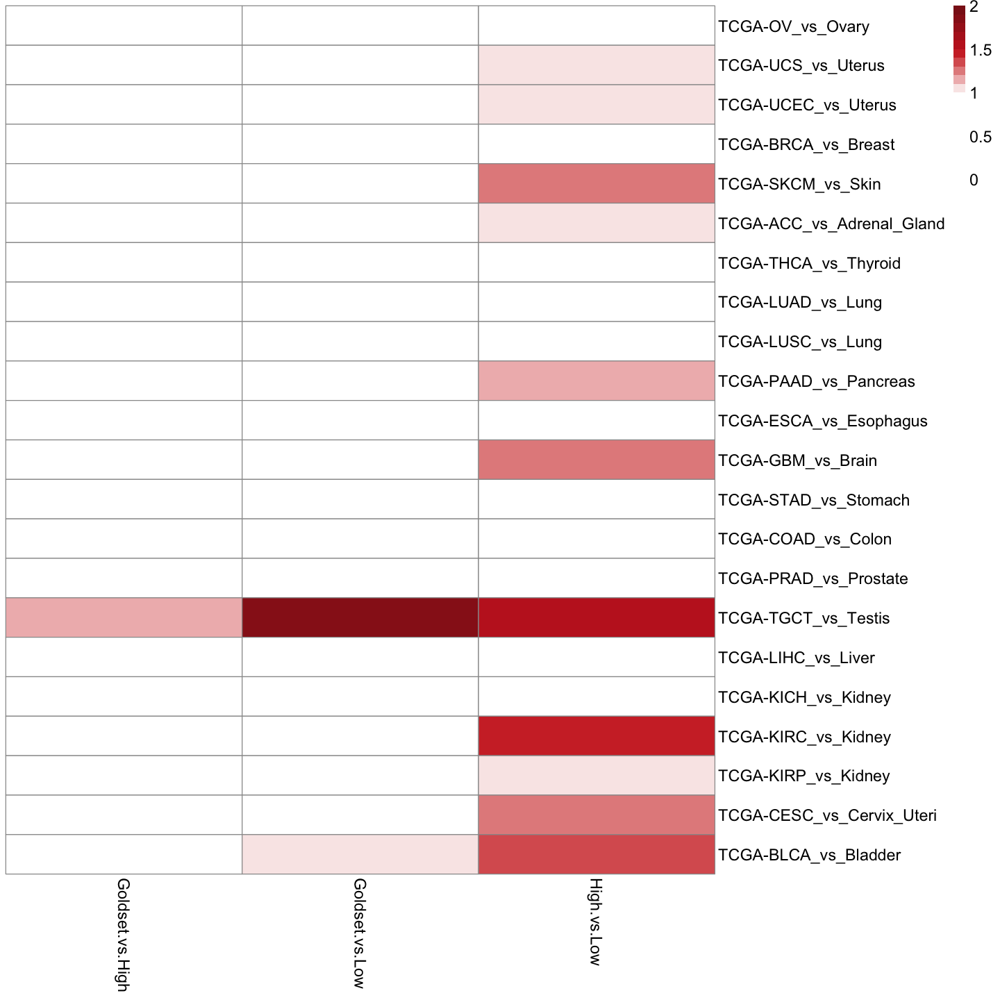

In [135]:
###### Overall DEG Fraction comparison between TCGA and GTEx for GodlSet, UNITe High and Low genes ####
####### Heatmap Representation.  ####

deg_fraction_df <- get_fraction_dataset(predicted_scores_list, cancer_genes_1)
fraction_ratioDF <- data.frame("Goldset vs High" = deg_fraction_df$Goldset_Ccancer/deg_fraction_df$High_NonCancer,
                               "Goldset vs Low" = deg_fraction_df$Goldset_Ccancer/deg_fraction_df$Low_NonCancer,
                               "High vs Low" = deg_fraction_df$High_NonCancer/deg_fraction_df$Low_NonCancer)
rownames(fraction_ratioDF) <- rownames(deg_fraction_df)
fraction_ratioDF
pheatmap(fraction_ratioDF, cluster_rows=F, cluster_cols=F,
         color = colorRampPalette(c('white',"white", "white", "firebrick3", "firebrick4"))(20),
         fontsize = 14,
         breaks = seq(0,2,.1))

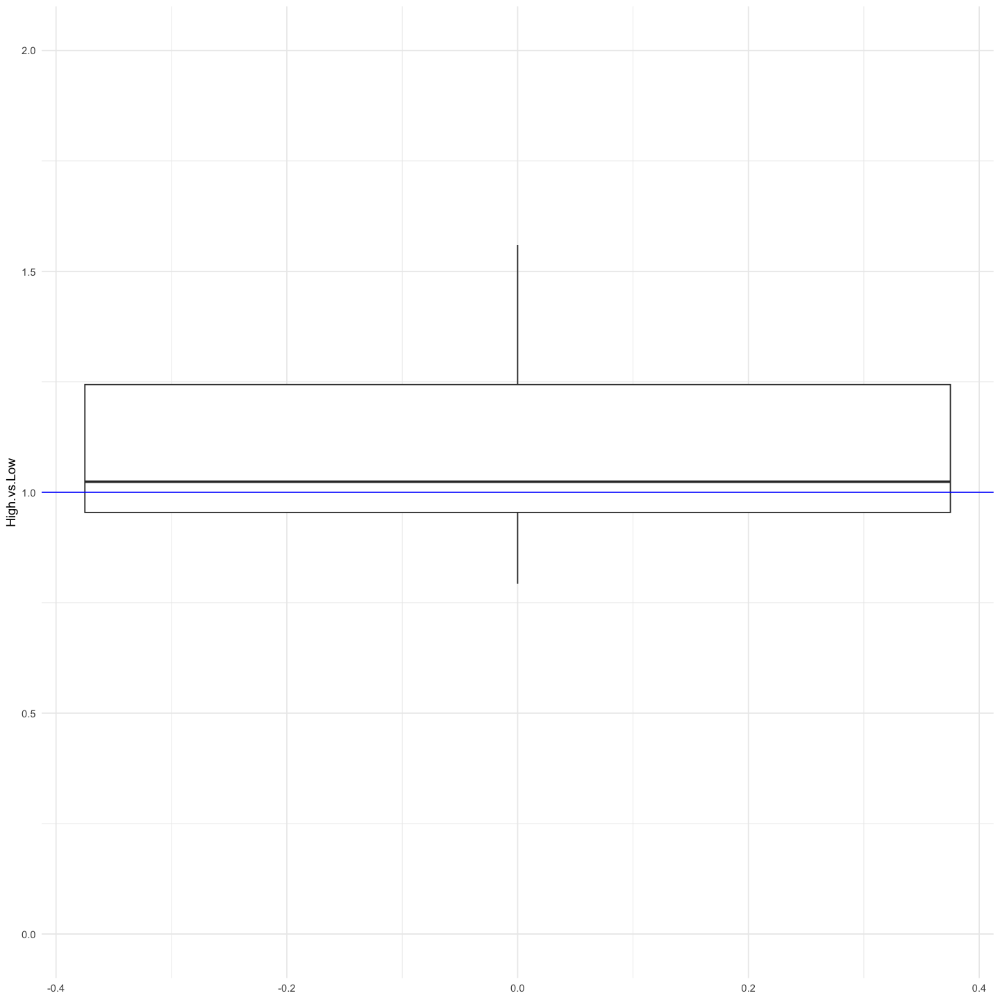

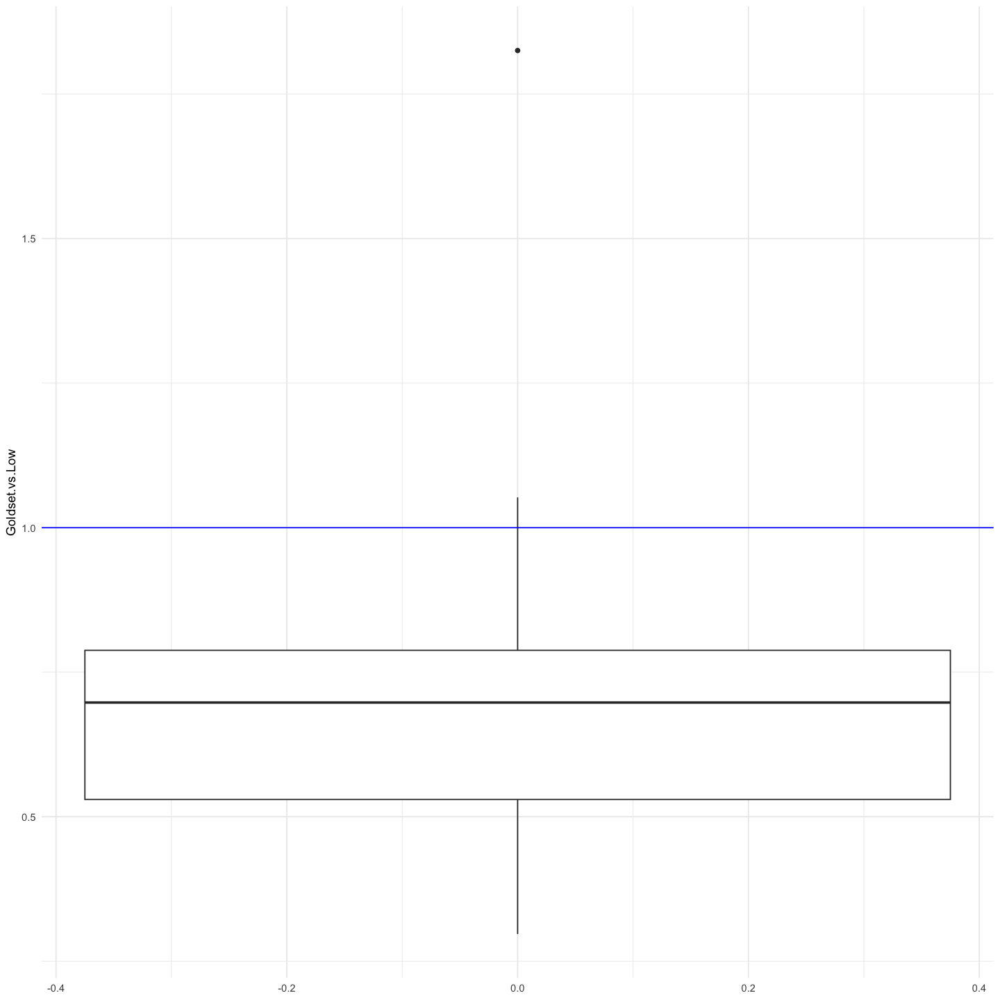

In [136]:
ggplot(fraction_ratioDF, aes(y=High.vs.Low)) +  # This is the plot function
  geom_boxplot(outlier.shape = NA)  +
  scale_y_continuous(limits=c(0,2)) +
  geom_hline(aes(yintercept=1), colour="blue") +
theme_minimal()
ggplot(fraction_ratioDF, aes(y=Goldset.vs.Low)) +  # This is the plot function
  geom_boxplot()  +
  geom_hline(aes(yintercept=1), colour="blue") +
theme_minimal()

,Goldset.vs.High,Goldset.vs.Low,High.vs.Low
,<dbl>,<dbl>,<dbl>
TCGA-OV_vs_Ovary,1.0713193,0.6734007,0.6285714
TCGA-UCS_vs_Uterus,0.7435466,0.7966570,1.0714286
TCGA-UCEC_vs_Uterus,0.8092797,0.7997867,0.9882698
TCGA-BRCA_vs_Breast,0.5611672,0.4591368,0.8181818
TCGA-SKCM_vs_Skin,0.6346184,0.8245723,1.2993197
TCGA-ACC_vs_Adrenal_Gland,0.4944550,0.5656566,1.1440000
TCGA-THCA_vs_Thyroid,0.8543143,0.9647032,1.1292135
TCGA-LUAD_vs_Lung,0.6562803,0.6097723,0.9291339
TCGA-LUSC_vs_Lung,0.6828189,0.7179640,1.0514706


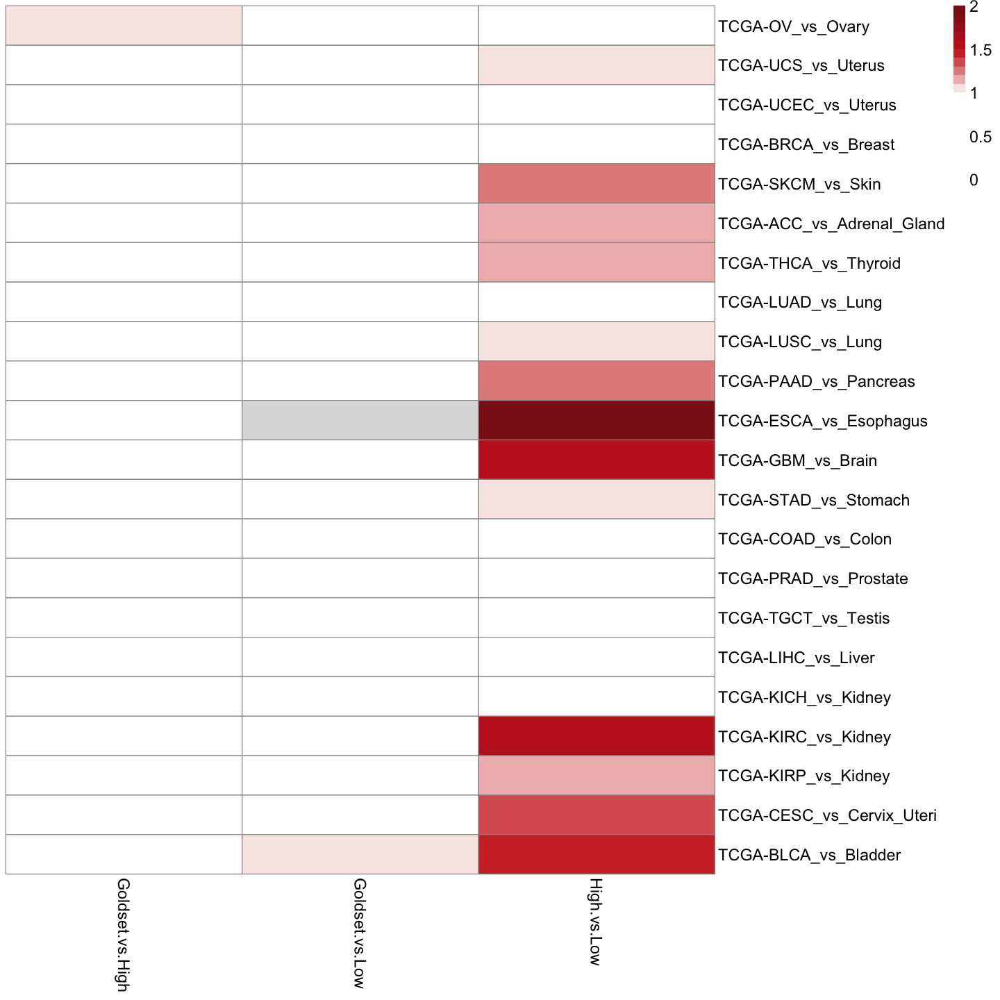

In [137]:
###### Upregulated DEGs Fraction comparison between TCGA and GTEx for GodlSet, UNITe High and Low genes ####
####### Heatmap Representation.  ####

deg_up_fraction_df<- get_fraction_dataset(predicted_scores_list, upregulated_cancer_genes_1)
fraction_up_ratioDF <- data.frame("Goldset vs High" = deg_up_fraction_df$Goldset_Ccancer/deg_up_fraction_df$High_NonCancer,
                               "Goldset vs Low" = deg_up_fraction_df$Goldset_Ccancer/deg_up_fraction_df$Low_NonCancer,
                               "High vs Low" = deg_up_fraction_df$High_NonCancer/deg_up_fraction_df$Low_NonCancer)
rownames(fraction_up_ratioDF) <- rownames(deg_up_fraction_df)
fraction_up_ratioDF
pheatmap(fraction_up_ratioDF, cluster_rows=F, cluster_cols=F,
         color = colorRampPalette(c('white',"white", "white", "firebrick3", "firebrick4"))(20),
         fontsize = 14,
         breaks = seq(0,2,.1))

,Goldset.vs.High,Goldset.vs.Low,High.vs.Low
,<dbl>,<dbl>,<dbl>
TCGA-OV_vs_Ovary,0.6750675,0.7928118,1.1744186
TCGA-UCS_vs_Uterus,0.7215007,1.2626263,1.7500000
TCGA-UCEC_vs_Uterus,0.7673912,0.8792377,1.1457490
TCGA-BRCA_vs_Breast,0.5577245,0.5411255,0.9702381
TCGA-SKCM_vs_Skin,0.3885004,0.5050505,1.3000000
TCGA-ACC_vs_Adrenal_Gland,0.0000000,0.0000000,0.2222222
TCGA-THCA_vs_Thyroid,0.5289380,0.4551327,0.8604651
TCGA-LUAD_vs_Lung,0.7614608,0.8061067,1.0586319
TCGA-LUSC_vs_Lung,0.7606182,0.6752012,0.8877005


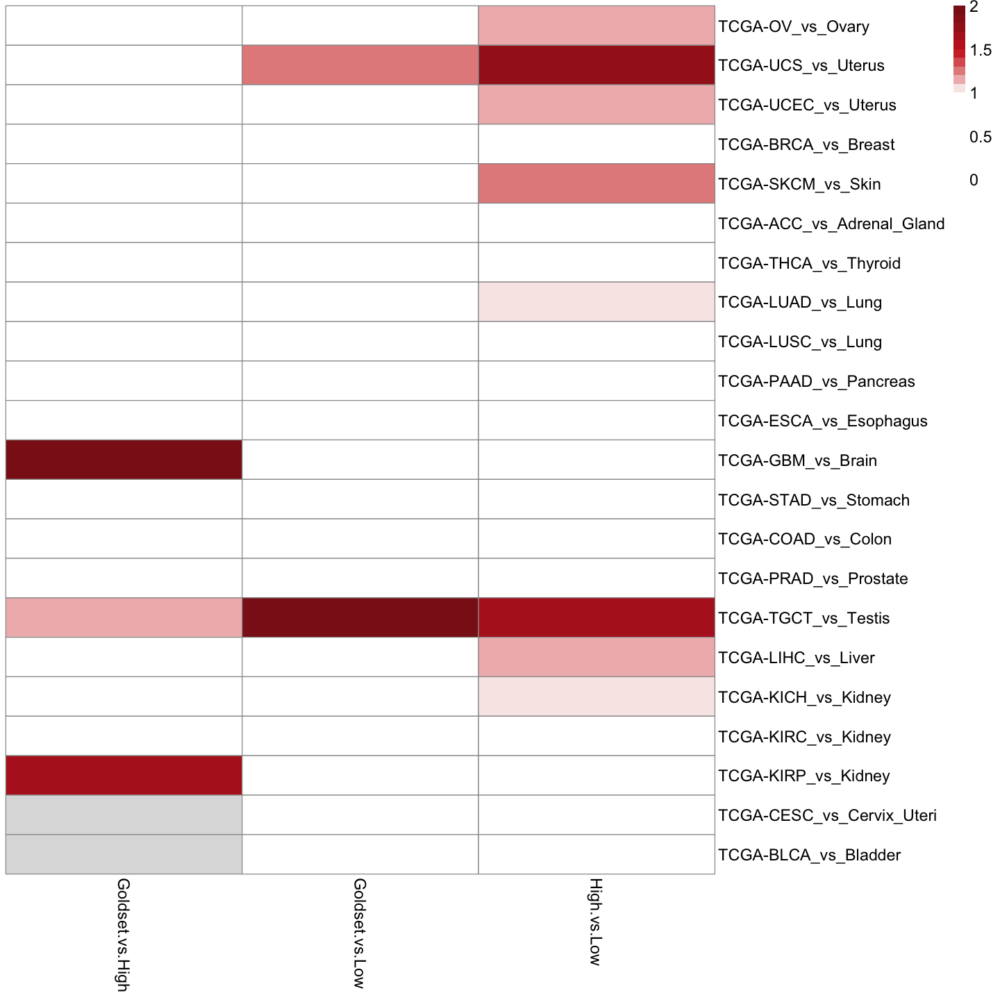

In [138]:
###### Downregulated DEGs Fraction comparison between TCGA and GTEx for GodlSet, UNITe High and Low genes ####
####### Heatmap Representation.  ####

deg_down_fraction_df<- get_fraction_dataset(predicted_scores_list, downregulated_cancer_genes_1)
fraction_down_ratioDF <- data.frame("Goldset vs High" = deg_down_fraction_df$Goldset_Ccancer/deg_down_fraction_df$High_NonCancer,
                               "Goldset vs Low" = deg_down_fraction_df$Goldset_Ccancer/deg_down_fraction_df$Low_NonCancer,
                               "High vs Low" = deg_down_fraction_df$High_NonCancer/deg_down_fraction_df$Low_NonCancer)
rownames(fraction_down_ratioDF) <- rownames(deg_down_fraction_df)
fraction_down_ratioDF
pheatmap(fraction_down_ratioDF, cluster_rows=F, cluster_cols=F,
         color = colorRampPalette(c('white',"white", "white", "firebrick3", "firebrick4"))(20),
         fontsize = 14,
         breaks = seq(0,2,.1))

In [139]:
reshape2::melt(fraction_ratioDF)

No id variables; using all as measure variables



variable,value
<fct>,<dbl>
Goldset.vs.High,0.7726519
Goldset.vs.High,0.7431261
Goldset.vs.High,0.7901597
Goldset.vs.High,0.5579046
Goldset.vs.High,0.6051296
Goldset.vs.High,0.4876350
Goldset.vs.High,0.6605288
Goldset.vs.High,0.7066244
Goldset.vs.High,0.7167602


No id variables; using all as measure variables



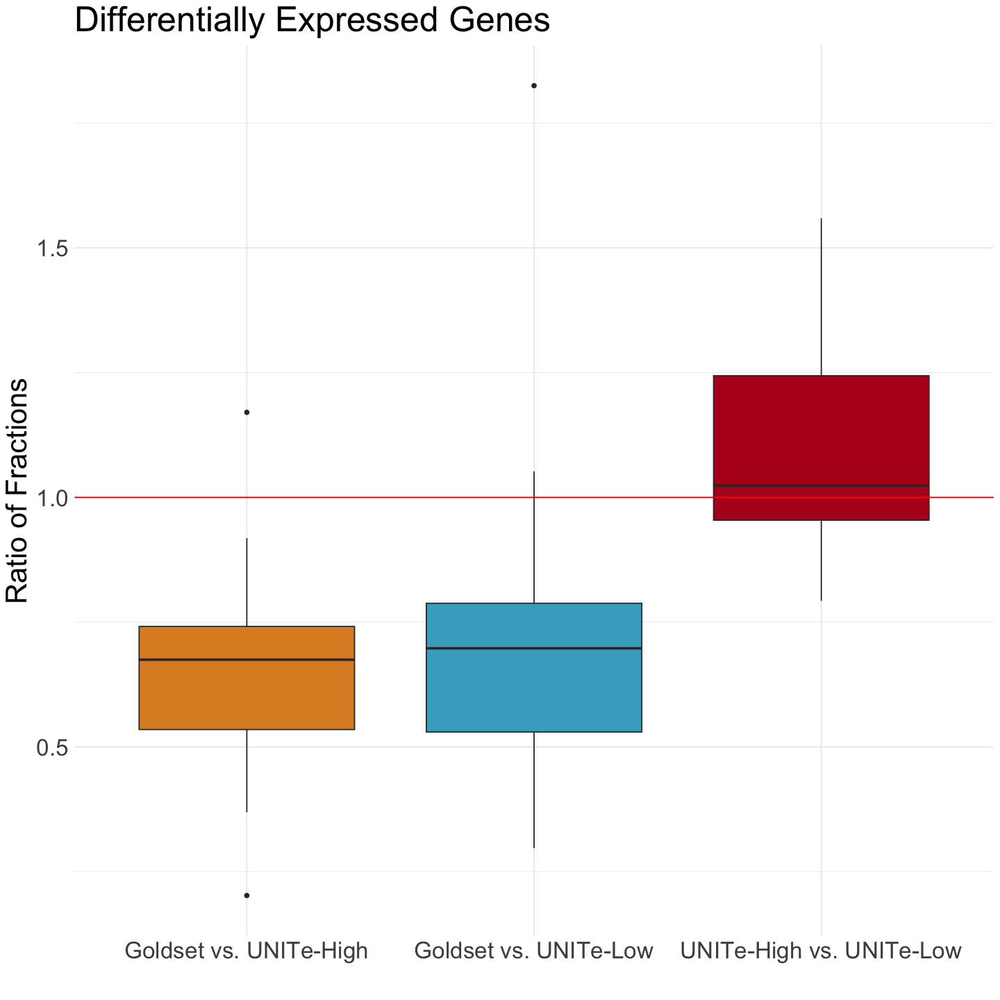

In [140]:
###### Overall DEG Fraction comparison between TCGA and GTEx for GodlSet, UNITe High and Low genes ####
####### Boxplot Representation.  ####

library("wesanderson")
ggplot(reshape2::melt(fraction_ratioDF), aes(y=value,x=variable, fill= variable)) +  # This is the plot function
  geom_boxplot()  +
  geom_hline(aes(yintercept=1), colour="red") +
theme_minimal() +
scale_fill_manual(values = wes_palette("FantasticFox1", n = 3,type = "continuous"),
                    name = "Categories")+ 
    theme(text = element_text(size=25),
          legend.position="none") +
scale_x_discrete(name ="",
                 labels=c("Goldset vs. UNITe-High",
                          "Goldset vs. UNITe-Low",
                          "UNITe-High vs. UNITe-Low"))+
labs(title="Differentially Expressed Genes",x="", y = "Ratio of Fractions")

# wilcoxon between the 2 verctors and star the significant ones

No id variables; using all as measure variables

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_boxplot()`).”


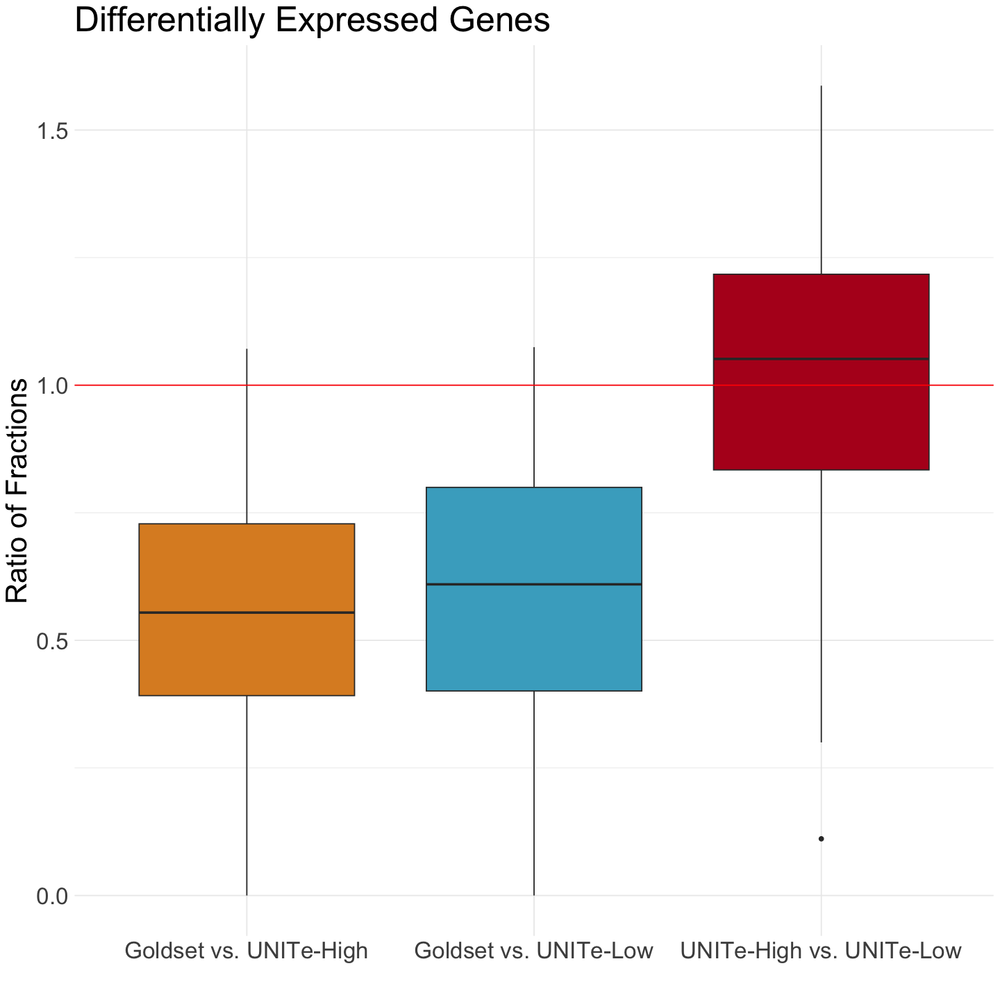

In [141]:
###### Upregulated DEG Fraction comparison between TCGA and GTEx for GodlSet, UNITe High and Low genes ####
####### Boxplot Representation.  ####

library("wesanderson")
ggplot(reshape2::melt(fraction_up_ratioDF), aes(y=value,x=variable, fill= variable)) +  # This is the plot function
  geom_boxplot()  +
  geom_hline(aes(yintercept=1), colour="red") +
theme_minimal() +
scale_fill_manual(values = wes_palette("FantasticFox1", n = 3,type = "continuous"),
                    name = "Categories")+ 
    theme(text = element_text(size=25),
          legend.position="none") +
scale_x_discrete(name ="",
                 labels=c("Goldset vs. UNITe-High",
                          "Goldset vs. UNITe-Low",
                          "UNITe-High vs. UNITe-Low"))+
labs(title="Differentially Expressed Genes",x="", y = "Ratio of Fractions")

# wilcoxon between the 2 verctors and star the significant ones

No id variables; using all as measure variables

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_boxplot()`).”


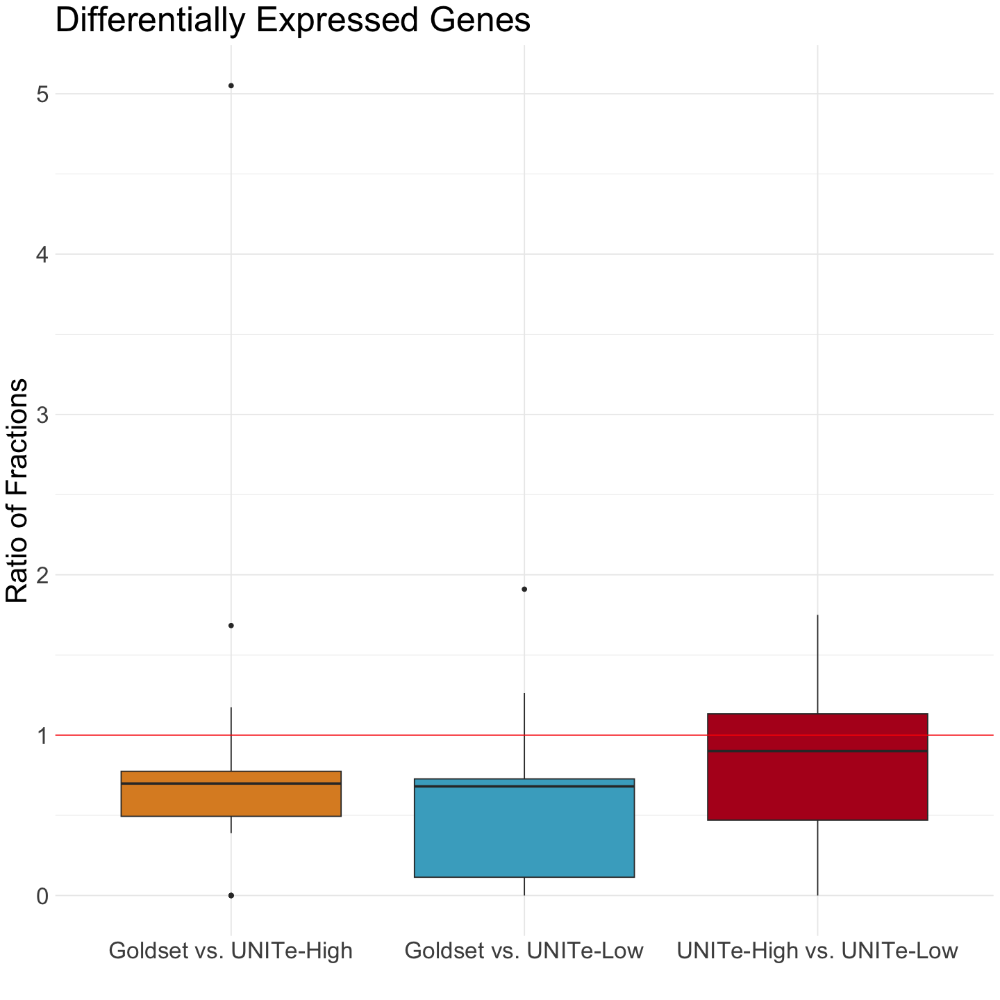

In [142]:
###### Downregulated DEG Fraction comparison between TCGA and GTEx for GodlSet, UNITe High and Low genes ####
####### Boxplot Representation.  ####

library("wesanderson")
ggplot(reshape2::melt(fraction_down_ratioDF), aes(y=value,x=variable, fill= variable)) +  # This is the plot function
  geom_boxplot()  +
  geom_hline(aes(yintercept=1), colour="red") +
theme_minimal() +
scale_fill_manual(values = wes_palette("FantasticFox1", n = 3,type = "continuous"),
                    name = "Categories")+ 
    theme(text = element_text(size=25),
          legend.position="none") +
scale_x_discrete(name ="",
                 labels=c("Goldset vs. UNITe-High",
                          "Goldset vs. UNITe-Low",
                          "UNITe-High vs. UNITe-Low"))+
labs(title="Differentially Expressed Genes",x="", y = "Ratio of Fractions")

# wilcoxon between the 2 verctors and star the significant ones

In [143]:
flattened_comparisons <-reshape2::melt(fraction_ratioDF)
unique(flattened_comparisons$variable)

flattened_comparisons_down <-reshape2::melt(fraction_down_ratioDF)
unique(flattened_comparisons_down$variable)

flattened_comparisons_up <-reshape2::melt(fraction_up_ratioDF)
unique(flattened_comparisons_up$variable)

No id variables; using all as measure variables



[1] Goldset.vs.High Goldset.vs.Low  High.vs.Low    
Levels: Goldset.vs.High Goldset.vs.Low High.vs.Low

No id variables; using all as measure variables



[1] Goldset.vs.High Goldset.vs.Low  High.vs.Low    
Levels: Goldset.vs.High Goldset.vs.Low High.vs.Low

No id variables; using all as measure variables



[1] Goldset.vs.High Goldset.vs.Low  High.vs.Low    
Levels: Goldset.vs.High Goldset.vs.Low High.vs.Low

In [148]:
gs_deg_frac <- flattened_comparisons[flattened_comparisons$variable == "Goldset.vs.High",]$value
high_deg_frac <- flattened_comparisons[flattened_comparisons$variable == "High.vs.Low",]$value
saveRDS(gs_deg_frac, "../data/for_my_analysis/gs_high_degFrac.RDS")
saveRDS(high_deg_frac, "../data/for_my_analysis/high_low_degFrac.RDS")

In [149]:
print(gs_deg_frac)

 [1] 0.7726519 0.7431261 0.7901597 0.5579046 0.6051296 0.4876350 0.6605288
 [8] 0.7066244 0.7167602 0.6887052 0.9182736 0.7215007 0.6202375 0.7358352
[15] 0.3689867 1.1704345 0.4361800 0.5303030 0.2020202 0.4208754 0.5476451
[22] 0.7538067


In [154]:
gs_deg_down_frac <- flattened_comparisons_down[flattened_comparisons_down$variable == "Goldset.vs.High",]$value
high_deg_down_frac <- flattened_comparisons_down[flattened_comparisons_down$variable == "High.vs.Low",]$value
saveRDS(gs_deg_down_frac, "../data/for_my_analysis/gs_high_degDownFrac.RDS")
saveRDS(high_deg_down_frac, "../data/for_my_analysis/high_low_degDownFrac.RDS")

In [155]:
#print(high_deg_down_frac)

 [1] 1.1744186 1.7500000 1.1457490 0.9702381 1.3000000 0.2222222 0.8604651
 [8] 1.0586319 0.8877005 0.6808511 0.7837838 0.1428571 0.8854749 0.9135802
[15] 1.0000000 1.6269430 1.1948052 1.0941704 0.4000000 0.3750000 0.0000000
[22] 0.0000000


In [156]:
gs_deg_up_frac <- flattened_comparisons_up[flattened_comparisons_up$variable == "Goldset.vs.High",]$value
high_deg_up_frac <- flattened_comparisons_up[flattened_comparisons_up$variable == "High.vs.Low",]$value
saveRDS(gs_deg_up_frac, "../data/for_my_analysis/gs_high_degUpFrac.RDS")
saveRDS(high_deg_up_frac, "../data/for_my_analysis/high_low_degUpFrac.RDS")

In [157]:
#print(high_deg_up_frac)

 [1] 0.6285714 1.0714286 0.9882698 0.8181818 1.2993197 1.1440000 1.1292135
 [8] 0.9291339 1.0514706 1.2173913       Inf 1.5483871 1.0039683 0.3000000
[15] 0.8340081 0.1111111 0.7272727 0.9343832 1.5869565 1.1217391 1.3174603
[22] 1.4255319


No id variables; using all as measure variables



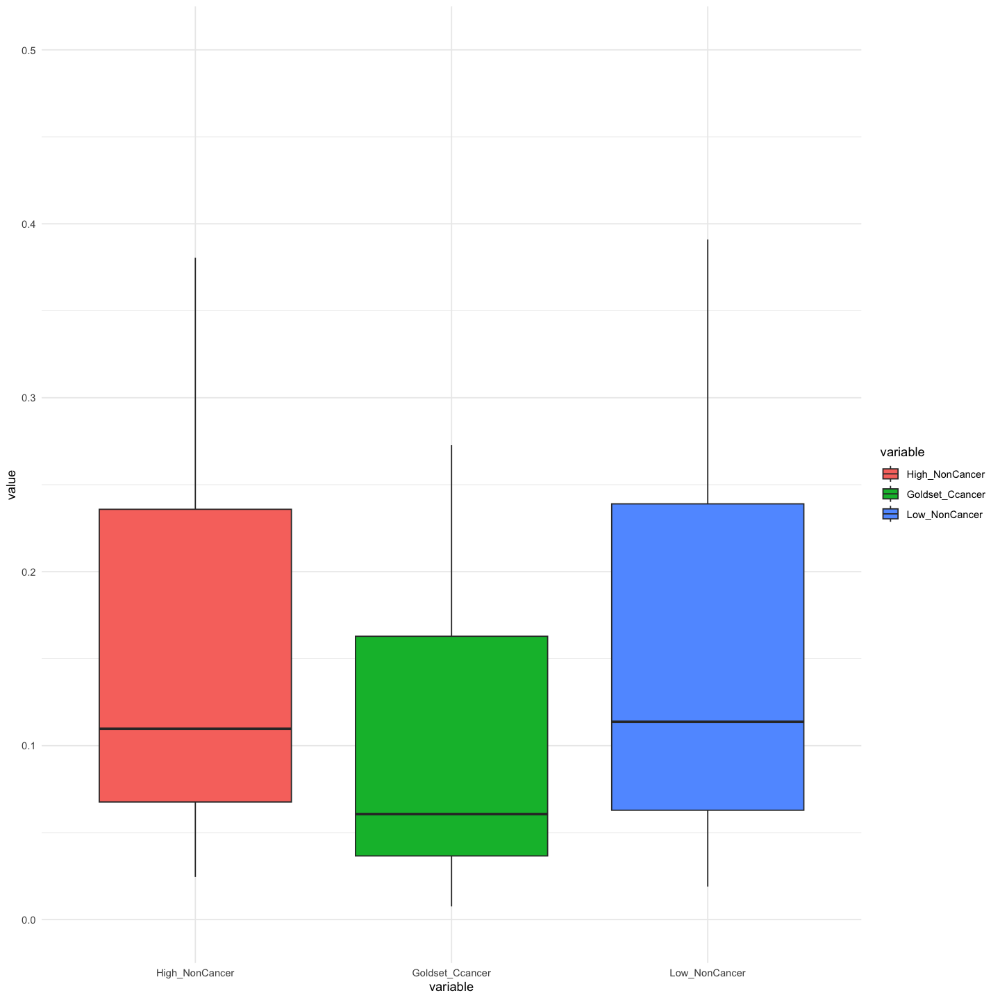

In [100]:
ggplot(reshape2::melt(deg_fraction_df), aes(y=value,x=variable, fill= variable)) + 
  geom_boxplot()  +
  scale_y_continuous(limits=c(0,.5)) +
theme_minimal()

In [101]:
fwrite(fraction_ratioDF, paste0("../data/for_my_analysis/", "fractionsDF_deg.txt"))

In [102]:
predicted_hallmark <- get_overlap_data(predicted_scores_list, pathways[["HALLMARK"]])

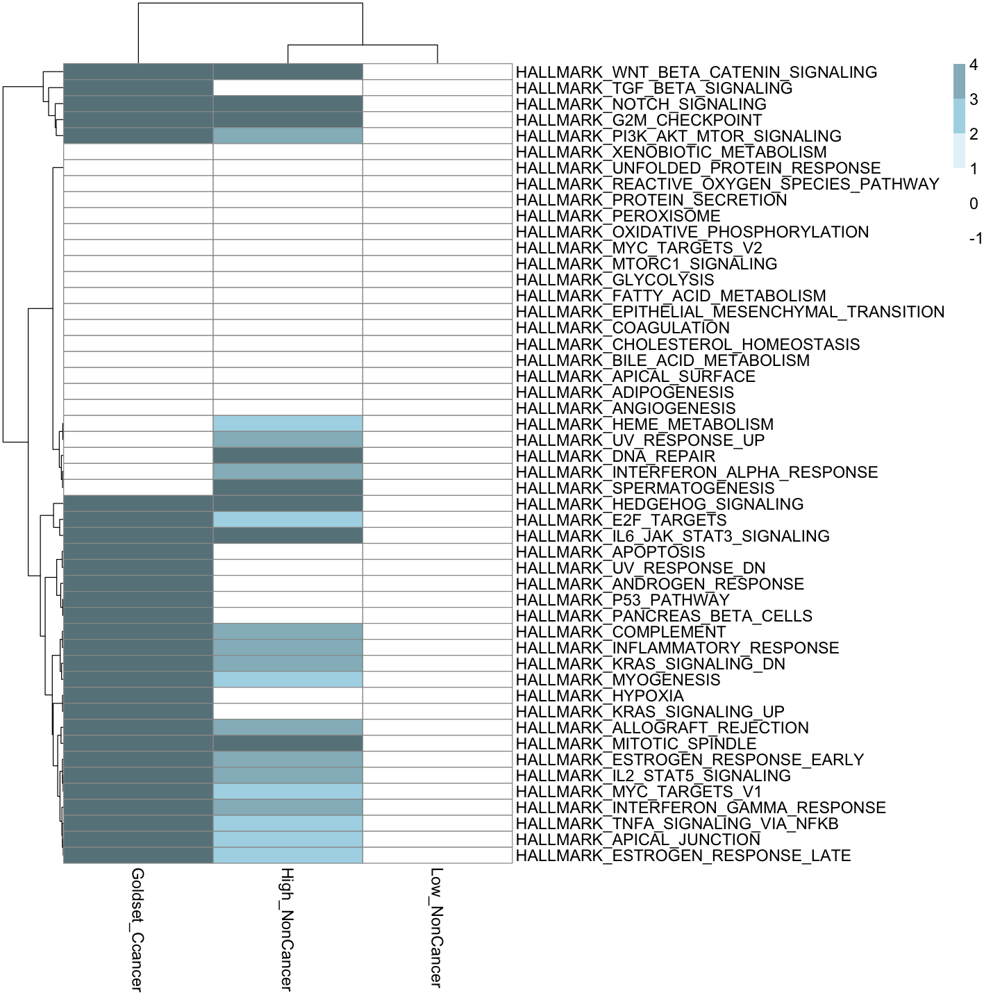

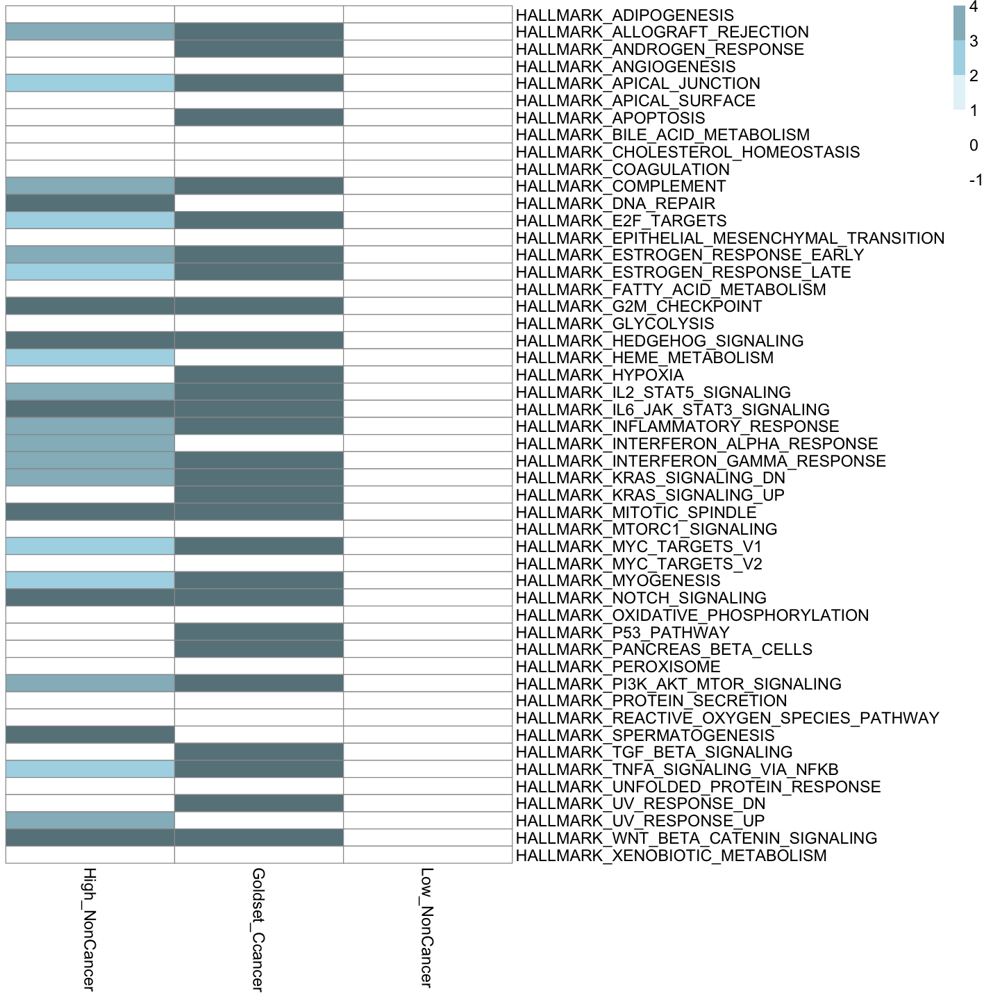

In [103]:
predicted_hallmark_new <- change_matrix(predicted_hallmark$matrix, predicted_hallmark$odds_matrix, -1)